# E.coli Model 

## Required Libraries

In [1]:
# required libraries
import os
import math
import time
from pathlib import Path
import tempfile
import functools
import pandas as pd
import numpy as np
import geopandas as gpd
import statistics
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, max_error, mean_absolute_error, precision_recall_curve, roc_curve, auc
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.neighbors import KNeighborsClassifier
pd.set_option("display.max_rows", None)
import scipy, joblib
import scipy.signal
import scipy.stats
from scipy import stats
from scipy.stats import pearsonr
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import confusion_matrix,  classification_report, roc_auc_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.svm import SVC
from xgboost import XGBClassifier
import xgboost as xg
from matplotlib.pyplot import figure
from matplotlib import pyplot
from IPython.display import display, clear_output
import logging
import keras
from keras.models import Sequential
import keras.backend as k
from keras.layers import Dense, GRU, LSTM, Activation, Masking, Dropout, BatchNormalization,Conv1D
from keras.callbacks import History
import keras.optimizers 
from keras import callbacks
#!pip install xgboost
from meteostat import Point, Daily, Hourly
from datetime import datetime, timedelta
import urllib
from urllib.error import HTTPError
import pickle
import requests
import folium
from folium.plugins import HeatMap, Draw, HeatMapWithTime
from tqdm.contrib.concurrent import process_map
from shapely.geometry import Point
import uuid
import pyarrow as pa
import pyarrow.parquet as pq
import warnings
warnings.filterwarnings('ignore')

2025-09-16 07:58:36.058237: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-09-16 07:58:36.415991: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-09-16 07:58:36.756448: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758009517.024084  531306 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758009517.097095  531306 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-09-16 07:58:37.808938: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [12]:
cache_dir = "data"
cache_dir = Path(tempfile.gettempdir()) if cache_dir is None else Path(cache_dir)
cache_dir = cache_dir 
        
# make cache dir
cache_dir.mkdir(exist_ok=True, parents=True)

## Data Extraction

Loading WQ_EA Data from your repo.

In [2]:
# Loading WQ_EA Data
path = "gs://rdmai_dev_data/raw/Water_Quality_EA/2000.csv"
dataset = pd.read_csv(path, sep=",")
for i in range(1,10):
    a = "{0}{1}.csv".format('gs://rdmai_dev_data/raw/Water_Quality_EA/200', i)
    print(i)
    dataset = pd.concat([dataset, pd.read_csv(a)]).reset_index(drop=True)
for i in range(10,25):
    a = "{0}{1}.csv".format('gs://rdmai_dev_data/raw/Water_Quality_EA/20', i)
    print(i)
    dataset = pd.concat([dataset, pd.read_csv(a)]).reset_index(drop=True)
dataset.shape

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


(68470660, 17)

In [3]:
dataset.head()

,@id,sample.samplingPoint,sample.samplingPoint.notation,sample.samplingPoint.label,sample.sampleDateTime,determinand.label,determinand.definition,determinand.notation,resultQualifier.notation,result,codedResultInterpretation.interpretation,determinand.unit.label,sample.sampledMaterialType.label,sample.isComplianceSample,sample.purpose.label,sample.samplingPoint.easting,sample.samplingPoint.northing
0,http://environment.data.gov.uk/water-quality/d...,http://environment.data.gov.uk/water-quality/i...,AN-011396,BUCKINGHAM GOLF CLUB TINGEWICK RD.,2000-01-04T14:10:00,Ammonia(N),Ammoniacal Nitrogen as N,111,NaN,10.4,NaN,mg/l,FINAL SEWAGE EFFLUENT,True,COMPLIANCE AUDIT (PERMIT),467020,233400
1,http://environment.data.gov.uk/water-quality/d...,http://environment.data.gov.uk/water-quality/i...,AN-011396,BUCKINGHAM GOLF CLUB TINGEWICK RD.,2000-01-04T14:10:00,Sld Sus@105C,"Solids, Suspended at 105 C",135,NaN,10.0,NaN,mg/l,FINAL SEWAGE EFFLUENT,True,COMPLIANCE AUDIT (PERMIT),467020,233400
2,http://environment.data.gov.uk/water-quality/d...,http://environment.data.gov.uk/water-quality/i...,AN-011396,BUCKINGHAM GOLF CLUB TINGEWICK RD.,2000-01-04T14:10:00,BOD ATU,BOD : 5 Day ATU,85,NaN,7.5,NaN,mg/l,FINAL SEWAGE EFFLUENT,True,COMPLIANCE AUDIT (PERMIT),467020,233400
3,http://environment.data.gov.uk/water-quality/d...,http://environment.data.gov.uk/water-quality/i...,AN-011396,BUCKINGHAM GOLF CLUB TINGEWICK RD.,2000-03-21T13:30:00,NO FLOW/SAMP,No flow /No sample,7668,NaN,0.0,NaN,coded,FINAL SEWAGE EFFLUENT,True,COMPLIANCE AUDIT (PERMIT),467020,233400
4,http://environment.data.gov.uk/water-quality/d...,http://environment.data.gov.uk/water-quality/i...,AN-011396,BUCKINGHAM GOLF CLUB TINGEWICK RD.,2000-06-28T13:20:00,Sld Sus@105C,"Solids, Suspended at 105 C",135,NaN,7.6,NaN,mg/l,FINAL SEWAGE EFFLUENT,True,COMPLIANCE AUDIT (PERMIT),467020,233400


droping unnecessary columns

In [ ]:
# drop unnecessary columns
datasetx = dataset.drop(['@id','codedResultInterpretation.interpretation'],axis=1)
datasetx = datasetx.drop(['sample.samplingPoint.label','determinand.definition','determinand.notation','resultQualifier.notation','determinand.unit.label','sample.isComplianceSample','sample.purpose.label'],axis=1)
datasetx.head()

seperate time and date columns and keeping only samples of interest

In [10]:
# seperate time and date columns and keeping only samples of interest
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
warnings.filterwarnings('ignore')

# Ensure datasetx exists and is a DataFrame
if 'datasetx' not in locals() or not isinstance(datasetx, pd.DataFrame):
    raise ValueError("datasetx is not defined or not a DataFrame")

# Separate time and date columns with error handling
try:
    datasetx['timedate'] = datasetx['sample.sampleDateTime'].str.replace('T',' ')
    datasetx['date'] = pd.to_datetime(datasetx['timedate'],format='%Y-%m-%d %H:%M:%S').dt.date
    datasetx['time'] = pd.to_datetime(datasetx['timedate'],format='%Y-%m-%d %H:%M:%S').dt.time
except Exception as e:
    logging.error(f"Error processing date/time columns: {e}")
    raise
    
# Ensure required columns exist before renaming
required_columns = ['determinand.label', 'sample.samplingPoint.notation']
for col in required_columns:
    if col not in datasetx.columns:
        raise KeyError(f"Missing required column: {col}")

#datasetx = datasetx.loc[datasetx['sample.sampledMaterialType.label'] == 'RIVER / RUNNING SURFACE WATER'] # only fresh water
datasetx.rename(columns = {'determinand.label':'determinandlabel'}, inplace = True)
datasetx.rename(columns = {'sample.samplingPoint.notation':'samplingPointnotation'}, inplace = True)

logging.info(f"Dataset shape after processing: {datasetx.shape}")

# Finding locations containing E. coli with error handling
try:
    counts = datasetx.groupby(['samplingPointnotation', 'determinandlabel']).size().to_frame(name='counts').reset_index()#.agg(['count', mean])
    counts = counts.loc[counts['determinandlabel'].str.contains("coli")].sort_values(by=['counts'], ascending=False).reset_index(drop=True)
    counts = counts.drop_duplicates(subset=['samplingPointnotation']).reset_index(drop=True)
    samplingPointnotation = counts.samplingPointnotation.unique()

    datasetx = datasetx.loc[datasetx['samplingPointnotation'].isin(samplingPointnotation)]
    timedate = datasetx.loc[datasetx['determinandlabel'].str.contains("coli")].timedate.unique()
    datasetx = datasetx.loc[datasetx['timedate'].isin(timedate)]
except Exception as e:
    logging.error(f"Error filtering E. coli locations: {e}")
    raise

logging.info(f"Dataset shape after filtering: {datasetx.shape}")
datasetx.head()

2025-02-07 10:14:29,542 - INFO - Dataset shape after processing: (68470660, 11)
2025-02-07 10:14:46,529 - INFO - Dataset shape after filtering: (2816316, 11)


,sample.samplingPoint,samplingPointnotation,sample.sampleDateTime,determinandlabel,result,sample.sampledMaterialType.label,sample.samplingPoint.easting,sample.samplingPoint.northing,timedate,date,time
57233,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07T13:00:00,O Diss% Satn,80.0,RIVER / RUNNING SURFACE WATER,583400,300900,2000-11-07 13:00:00,2000-11-07,13:00:00
57234,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07T13:00:00,O Dissolved,8.9,RIVER / RUNNING SURFACE WATER,583400,300900,2000-11-07 13:00:00,2000-11-07,13:00:00
57235,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07T13:00:00,Chloride Ion,25.5,RIVER / RUNNING SURFACE WATER,583400,300900,2000-11-07 13:00:00,2000-11-07,13:00:00
57236,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07T13:00:00,BOD ATU,1.6,RIVER / RUNNING SURFACE WATER,583400,300900,2000-11-07 13:00:00,2000-11-07,13:00:00
57237,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07T13:00:00,Copper - Cu,4.8,RIVER / RUNNING SURFACE WATER,583400,300900,2000-11-07 13:00:00,2000-11-07,13:00:00


Save all raw E.coli samples

In [2]:
# Save all raw E.coli samples
#datasetx.to_csv('train_ecoli_raw_all_git.csv', index=False)
datasetx = pd.read_csv('train_ecoli_raw_all_git.csv') # temporary saves
datasetx.timedate.unique().shape  

(168050,)

In [21]:
#datasetx = datasetx[~(datasetx['date'] < '2023-08-18')]

## Data Engineering

In [15]:
datasetx.rename(columns = {'sample.samplingPoint.notation':'samplingPointnotation'}, inplace = True)
datasetx.rename(columns = {'sample.samplingPoint.easting':'easting'}, inplace = True)
datasetx.rename(columns = {'sample.samplingPoint.northing':'northing'}, inplace = True)
print(datasetx.shape)

(2816316, 11)


Transpose the dataframe from horizental to Vertical representation

In [ ]:
# Transpose the dataframe from horizental to Vertical representation
import warnings
warnings.filterwarnings('ignore')
try:
    column_list = datasetx.determinandlabel.unique()
    column_list = np.append(['easting','northing','samplesamplingPoint', 'samplingPointnotation', 'timedate', 'date', 'time'], column_list)
    datasetxx = pd.DataFrame(columns=column_list)
except Exception as e:
    logging.error(f"Error initializing datasetxx: {e}")
    raise
j = 0
for timedate in datasetx.timedate.unique():
    j += 1
    if j%10000 == 0:
        print(j)
    class_ = datasetx.loc[datasetx['timedate'] == timedate]
    if class_.loc[class_['determinandlabel'].str.contains("coli")].reset_index(drop=True).shape[0] >= 1: #if there was ecoli in the given timedate
        datasetxx.loc[len(datasetxx)] = pd.Series(dtype='float64') # create empty row

        datasetxx.iloc[[-1],0:7] = [class_['easting'].iloc[0], class_['northing'].iloc[0],
                                    class_['sample.samplingPoint'].iloc[0], class_['samplingPointnotation'].iloc[0]
                                  , class_['timedate'].iloc[0], class_['date'].iloc[0], class_['time'].iloc[0]] # replace NaN with first seven columns
        for label in class_.determinandlabel.unique():
            datasetxx[label].iloc[-1] = class_[class_.determinandlabel == label]['result'].iloc[0] # replace NaN with rest related columns


100
200
300
400
500
600
700
800
900
1000
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
1

NameError: name 'convertLL' is not defined

create (longitude, latitude) columns from (easting, northing)

In [18]:
from pyproj import Proj, transform

v84 = Proj(proj="latlong",towgs84="0,0,0",ellps="WGS84")
v36 = Proj(proj="latlong", k=0.9996012717, ellps="airy",
    towgs84="446.448,-125.157,542.060,0.1502,0.2470,0.8421,-20.4894")
vgrid = Proj(init="world:bng")

def convertLL(row):
    #Returns (longitude, latitude)

    easting = row['easting']
    northing = row['northing']

    vlon36, vlat36 = vgrid(easting, northing, inverse=True)

    converted = transform(v36, v84, vlon36, vlat36)

    row['Long'] = converted[0]
    row['Lat'] = converted[1]

    return row

# change (easting, northing) to (longitude, latitude)
datasetxx = datasetxx.apply(convertLL, axis=1)

In [19]:
datasetxx.head()

,easting,northing,samplesamplingPoint,samplingPointnotation,timedate,date,time,O Diss% Satn,O Dissolved,Chloride Ion,...,SigCrDNAP:NF,CplagDNACopy,SigCrDNACopy,WCCrDNA P:NF,WCCrDNA Copy,MeFOSE,AmmoniaNoIo%,Acrylamide,Long,Lat
0,583400.0,300900.0,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07 13:00:00,2000-11-07,13:00:00,80.0,8.9,25.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.705061,52.574987
1,580787.0,294455.0,http://environment.data.gov.uk/water-quality/i...,AN-48M08,2000-05-09 12:10:00,2000-05-09,12:10:00,105.0,10.6,34.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.663039,52.517985
2,566300.0,337500.0,http://environment.data.gov.uk/water-quality/i...,AN-66M11,2000-05-25 09:30:00,2000-05-25,09:30:00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.471512,52.909194
3,566300.0,337500.0,http://environment.data.gov.uk/water-quality/i...,AN-66M11,2000-06-14 11:50:00,2000-06-14,11:50:00,NaN,NaN,24.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.471512,52.909194
4,636000.0,260100.0,http://environment.data.gov.uk/water-quality/i...,AN-ALD020,2000-08-22 11:15:00,2000-08-22,11:15:00,NaN,NaN,78.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.451225,52.188607


In [3]:
# train_ecoli_all1_git.csv is the all Types measurement for UK with some duplicated rows
# train_ecoli_all.csv is the all Types measurement for UK with NO duplicated rows
# train_ecoli.csv is the freshwater/river Type measurement for UK 

#datasetxx.to_csv('train_ecoli_all1_git.csv', index=False)
datasetxx = pd.read_csv('train_ecoli_all1_git.csv') # temporary saves
datasetxx.shape

(168050, 1941)

In [4]:
datasetxx.head()

,easting,northing,samplesamplingPoint,samplingPointnotation,timedate,date,time,O Diss% Satn,O Dissolved,Chloride Ion,...,SigCrDNAP:NF,CplagDNACopy,SigCrDNACopy,WCCrDNA P:NF,WCCrDNA Copy,MeFOSE,AmmoniaNoIo%,Acrylamide,Long,Lat
0,583400.0,300900.0,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07 13:00:00,2000-11-07,13:00:00,80.0,8.9,25.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.705061,52.574987
1,580787.0,294455.0,http://environment.data.gov.uk/water-quality/i...,AN-48M08,2000-05-09 12:10:00,2000-05-09,12:10:00,105.0,10.6,34.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.663039,52.517985
2,566300.0,337500.0,http://environment.data.gov.uk/water-quality/i...,AN-66M11,2000-05-25 09:30:00,2000-05-25,09:30:00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.471512,52.909194
3,566300.0,337500.0,http://environment.data.gov.uk/water-quality/i...,AN-66M11,2000-06-14 11:50:00,2000-06-14,11:50:00,NaN,NaN,24.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.471512,52.909194
4,636000.0,260100.0,http://environment.data.gov.uk/water-quality/i...,AN-ALD020,2000-08-22 11:15:00,2000-08-22,11:15:00,NaN,NaN,78.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.451225,52.188607


keep features with atleast 5% (n=95) of valid measurements (not NaN)

In [98]:
# keep features with atleast 5% (n=95) of valid measurements (not NaN)
nn = 95
datasetxx = datasetxx.drop(datasetxx.loc[:,list((100*(datasetxx.isnull().sum()/len(datasetxx.index))>nn))].columns, axis=1) 
print(datasetxx.shape)

(168050, 56)


In [99]:
datasetxx.head()

,easting,northing,samplesamplingPoint,samplingPointnotation,timedate,date,time,Chloride Ion,BOD ATU,Ammonia(N),...,BWP - A.B.,BWP - O.L.,BWP - A.F.,IE Pres,IE Conf,TarryResidus,Beach Sign,Pollutn Sign,Long,Lat
0,583400.0,300900.0,http://environment.data.gov.uk/water-quality/i...,AN-48M06,2000-11-07 13:00:00,2000-11-07,13:00:00,25.5,1.6,0.054,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.705061,52.574987
1,580787.0,294455.0,http://environment.data.gov.uk/water-quality/i...,AN-48M08,2000-05-09 12:10:00,2000-05-09,12:10:00,34.6,1.0,0.034,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.663039,52.517985
2,566300.0,337500.0,http://environment.data.gov.uk/water-quality/i...,AN-66M11,2000-05-25 09:30:00,2000-05-25,09:30:00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.471512,52.909194
3,566300.0,337500.0,http://environment.data.gov.uk/water-quality/i...,AN-66M11,2000-06-14 11:50:00,2000-06-14,11:50:00,24.9,1.9,0.254,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.471512,52.909194
4,636000.0,260100.0,http://environment.data.gov.uk/water-quality/i...,AN-ALD020,2000-08-22 11:15:00,2000-08-22,11:15:00,78.4,1.0,0.030,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.451225,52.188607


In [100]:
datasetxx1 = datasetxx.drop_duplicates(subset=['timedate']).reset_index(drop=True)
datasetxx1.shape

(168050, 56)

In [109]:
# Function to generate a unique ID with a length of 20
def generate_unique_id():
    return str(uuid.uuid4()).replace('-', '')[:20]

# Generate a column of unique IDs
num_ids = len(datasetxx1)  
unique_ids = [generate_unique_id() for _ in range(num_ids)]

datasetxx1['id'] = unique_ids.copy()

In [200]:
#datasetxx1.to_csv('train_ecoli_all1_git1.csv', index=False) # temporary saves
datasetxx1 = pd.read_csv('train_ecoli_all1_git1.csv') # temporary saves
datasetxx1.shape

(168050, 57)

In [204]:
datasetxx1[['SALinsitu','E.coli C-MF']].dropna().reset_index(drop=True).shape#.isnull().sum()

(91323, 2)

In [7]:
# Loading Wales Data
path = "gs://rdmai_dev_data/raw/WQ_Wales/2000.csv"
dataset = pd.read_csv(path, sep=",")
for i in range(1,10):
    a = "{0}{1}.csv".format('gs://rdmai_dev_data/raw/WQ_Wales/200', i)
    print(i)
    dataset = pd.concat([dataset, pd.read_csv(a)]).reset_index(drop=True)
for i in range(10,25):
    a = "{0}{1}.csv".format('gs://rdmai_dev_data/raw/WQ_Wales/20', i)
    print(i)
    dataset = pd.concat([dataset, pd.read_csv(a)]).reset_index(drop=True)
dataset.shape

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


(7787214, 22)

In [8]:
dataset.head()

,station_number,station_name,station_type,easting,northing,ngr,local_authority,sampling_datetime,sampling_reason,reason_group,...,parameter_shortname,parameter_name,sample_value,coded_value,unit_name,unit_symbol,sign,method_name,deviating_result,sampling_year
0,S00060200,R.SEVERN AT LLANDRINIO,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,SJ2984316977,POWYS-POWYS,2000-01-14 08:33:00,ENVIRONMENTAL MONITORING STATUTORY (EU DIRECTI...,Planned environmental monitoring,...,664,"Oil and Grease, Visible : Present/Not found (1/0)",0.0,NaN,scalar,---,---,Field,NaN,2000.0
1,S00060200,R.SEVERN AT LLANDRINIO,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,SJ2984316977,POWYS-POWYS,2000-01-14 08:33:00,ENVIRONMENTAL MONITORING STATUTORY (EU DIRECTI...,Planned environmental monitoring,...,118,Nitrite as N,0.017,NaN,milligram per litre,mg/l,---,Low,NaN,2000.0
2,S00060200,R.SEVERN AT LLANDRINIO,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,SJ2984316977,POWYS-POWYS,2000-01-14 08:33:00,ENVIRONMENTAL MONITORING STATUTORY (EU DIRECTI...,Planned environmental monitoring,...,180,"Orthophosphate, reactive as P",0.064,NaN,milligram per litre,mg/l,---,Low,NaN,2000.0
3,S00060200,R.SEVERN AT LLANDRINIO,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,SJ2984316977,POWYS-POWYS,2000-01-14 08:33:00,ENVIRONMENTAL MONITORING STATUTORY (EU DIRECTI...,Planned environmental monitoring,...,111,Ammoniacal Nitrogen as N,0.09,NaN,milligram per litre,mg/l,---,Low,NaN,2000.0
4,S00060200,R.SEVERN AT LLANDRINIO,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,SJ2984316977,POWYS-POWYS,2000-01-14 08:33:00,ENVIRONMENTAL MONITORING STATUTORY (EU DIRECTI...,Planned environmental monitoring,...,108,Cadmium,0.194,NaN,microgram per litre,µg/l,---,Low,NaN,2000.0


In [25]:
# dropping unncessesary columns
datasetx = dataset.drop(['station_name','sampling_reason','sampling_mechanism'],axis=1)
datasetx = datasetx.drop(['local_authority','ngr','reason_group','coded_value','unit_name','sign','method_name','deviating_result','sampling_year'],axis=1)
datasetx.head()

,station_number,station_type,easting,northing,sampling_datetime,sampling_medium,parameter_shortname,parameter_name,sample_value,unit_symbol
0,S00060200,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,2000-01-14 08:33:00,RIVER / RUNNING SURFACE WATER,664,"Oil and Grease, Visible : Present/Not found (1/0)",0.0,---
1,S00060200,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,2000-01-14 08:33:00,RIVER / RUNNING SURFACE WATER,118,Nitrite as N,0.017,mg/l
2,S00060200,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,2000-01-14 08:33:00,RIVER / RUNNING SURFACE WATER,180,"Orthophosphate, reactive as P",0.064,mg/l
3,S00060200,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,2000-01-14 08:33:00,RIVER / RUNNING SURFACE WATER,111,Ammoniacal Nitrogen as N,0.09,mg/l
4,S00060200,FRESHWATER - NON CLASSIFIED RIVER POINTS,329843,316977,2000-01-14 08:33:00,RIVER / RUNNING SURFACE WATER,108,Cadmium,0.194,µg/l


In [26]:
# seperate time and date
datasetx['timedate'] = datasetx['sampling_datetime'].str.replace('T',' ')
datasetx['date'] = pd.to_datetime(datasetx['timedate'],format='%Y-%m-%d %H:%M:%S').dt.date
datasetx['time'] = pd.to_datetime(datasetx['timedate'],format='%Y-%m-%d %H:%M:%S').dt.time
#datasetx = datasetx.loc[datasetx['sample.sampledMaterialType.label'] == 'RIVER / RUNNING SURFACE WATER'] # only fresh water
datasetx.rename(columns = {'parameter_name':'determinandlabel'}, inplace = True)
datasetx.rename(columns = {'station_number':'samplingPointnotation'}, inplace = True)
print(datasetx.shape)
# finding location contains E.coli (Escherichia coli : Confirmed : MF) 2348 (E.coli notation)
counts = datasetx.groupby(['samplingPointnotation', 'parameter_shortname']).size().to_frame(name='counts').reset_index()#.agg(['count', mean])
counts = counts.loc[counts['parameter_shortname'] == 2348].sort_values(by=['counts'], ascending=False).reset_index(drop=True)
counts = counts.drop_duplicates(subset=['samplingPointnotation']).reset_index(drop=True)
samplingPointnotation = counts.samplingPointnotation.unique()

datasetx = datasetx.loc[datasetx['samplingPointnotation'].isin(samplingPointnotation)]
timedate = datasetx.loc[datasetx['parameter_shortname'] == 2348].date.unique()
datasetx = datasetx.loc[datasetx['date'].isin(timedate)]

print(datasetx.shape)
datasetx.head()

(7787214, 13)
(456233, 13)


,samplingPointnotation,station_type,easting,northing,sampling_datetime,sampling_medium,parameter_shortname,determinandlabel,sample_value,unit_symbol,timedate,date,time
34170,S13001,FRESHWATER - UNSPECIFIED,289100,178400,2000-05-15 11:35:00,ANY WATER,6716,"Dimethylbenzene : Sum of isomers (1,3- 1,4-)",11.4,µg/l,2000-05-15 11:35:00,2000-05-15,11:35:00
34171,S13001,FRESHWATER - UNSPECIFIED,289100,178400,2000-05-15 11:35:00,ANY WATER,37,"Flow, instantaneous m3/s",2.177,m³/s,2000-05-15 11:35:00,2000-05-15,11:35:00
34172,S13001,FRESHWATER - UNSPECIFIED,289100,178400,2000-05-15 11:35:00,ANY WATER,6452,Copper,2.39,µg/l,2000-05-15 11:35:00,2000-05-15,11:35:00
34173,S13001,FRESHWATER - UNSPECIFIED,289100,178400,2000-05-15 11:35:00,ANY WATER,135,"Solids, Suspended at 105 C",6.0,mg/l,2000-05-15 11:35:00,2000-05-15,11:35:00
34174,S13001,FRESHWATER - UNSPECIFIED,289100,178400,2000-05-15 11:35:00,ANY WATER,6455,Zinc,9.29,µg/l,2000-05-15 11:35:00,2000-05-15,11:35:00


In [27]:
# Transpose the dataframe from horizental to Vertical representation
import warnings
warnings.filterwarnings('ignore')
try:
    column_list = datasetx.determinandlabel.unique()
    column_list = np.append(['easting','northing','station_type','sampling_medium','samplingPointnotation','timedate','date','time'], column_list)
    datasetxx = pd.DataFrame(columns=column_list)
except Exception as e:
    logging.error(f"Error initializing datasetxx: {e}")
    raise
j = 0
for timedate in datasetx.timedate.unique():
    j += 1
    if j%10000 == 0:
        print(j)
    class_ = datasetx.loc[datasetx['timedate'] == timedate]
    if class_.loc[class_['determinandlabel'].str.contains("Escherichia")].reset_index(drop=True).shape[0] >= 1: #if there was ecoli in the given timedate
        datasetxx.loc[len(datasetxx)] = pd.Series(dtype='float64') # create empty row

        datasetxx.iloc[[-1],0:8] = [class_['easting'].iloc[0], class_['northing'].iloc[0],class_['station_type'].iloc[0],
                                    class_['sampling_medium'].iloc[0], class_['samplingPointnotation'].iloc[0]
                                  , class_['timedate'].iloc[0], class_['date'].iloc[0], class_['time'].iloc[0]] # replace NaN with first seven columns
        for label in class_.determinandlabel.unique():
            datasetxx[label].iloc[-1] = class_[class_.determinandlabel == label]['sample_value'].iloc[0] # replace NaN with rest related columns

10000
20000
30000


In [29]:
from pyproj import Proj, transform

v84 = Proj(proj="latlong",towgs84="0,0,0",ellps="WGS84")
v36 = Proj(proj="latlong", k=0.9996012717, ellps="airy",
    towgs84="446.448,-125.157,542.060,0.1502,0.2470,0.8421,-20.4894")
vgrid = Proj(init="world:bng")

def convertLL(row):
    #Returns (longitude, latitude)

    easting = row['easting']
    northing = row['northing']

    vlon36, vlat36 = vgrid(easting, northing, inverse=True)

    converted = transform(v36, v84, vlon36, vlat36)

    row['Long'] = converted[0]
    row['Lat'] = converted[1]

    return row

# change (easting, northing) to (longitude, latitude)
datasetxx = datasetxx.apply(convertLL, axis=1)

In [31]:
datasetxx.head()

,easting,northing,station_type,sampling_medium,samplingPointnotation,timedate,date,time,"Dimethylbenzene : Sum of isomers (1,3- 1,4-)","Flow, instantaneous m3/s",...,"2,4,4-TriBromoDiphenylEther","2,2,4,4,5,5-Hexabromodiphenyl ether :- {PBDE 153}","2,2,4,4,5,6-Hexabromodiphenyl ether :- {PBDE 154}","2,2,4,4,5-Pentabromodiphenyl ether :- {PBDE 99}","2,2,4,4,6-Pentabromodiphenyl ether :- {PBDE 100}","2,2,4,4-Tetrabromodiphenyl ether :- {PBDE 47}",Identity of hand held meter,HCH -epsilon,Long,Lat
0,260840.0,315900.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S20014,2000-06-02 13:18:00,2000-06-02,13:18:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.061922,52.722796
1,260604.0,290085.0,SALINE WATER - DESIGNATED BATHING BEACHES,ANY WATER,S20023,2000-05-22 10:00:00,2000-05-22,10:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.054526,52.490815
2,276550.0,381650.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S25032,2000-06-09 10:50:00,2000-06-09,10:50:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.854622,53.317342
3,223300.0,379900.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S27546,2000-05-15 12:00:00,2000-05-15,12:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.652209,53.286532
4,274500.0,379250.0,SALINE WATER - DESIGNATED SHELLFISHERIES,SEA WATER,S27917,2000-05-30 12:30:00,2000-05-30,12:30:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.884428,53.295299


In [38]:
#datasetxx.to_csv('train_ecoli_raw_all_wales_git.csv', index=False)
datasetxx = pd.read_csv('train_ecoli_raw_all_wales_git.csv')  #temporary, to be deleted
datasetxx.shape

(24649, 527)

In [39]:
# keep features with atleast 5% (n=95) of valid measurements (not NaN)
nn = 95
datasetxx2 = datasetxx.drop(datasetxx.loc[:,list((100*(datasetxx.isnull().sum()/len(datasetxx.index))>nn))].columns, axis=1) 
print(datasetxx2.shape)

(24649, 38)


In [40]:
datasetxx2.head()

,easting,northing,station_type,sampling_medium,samplingPointnotation,timedate,date,time,Temperature of Water,Weather : Sunshine : Southern Region Code,...,MST Filtration,Bathers per 100 m,Enterococci: Intestinal: Presumptive: MF,Enterococci: Intestinal: Confirmed: MF,Beach signage confirmation,Tarry residues,Warning Sign - Short Term Bathing Water Pollution,Identity of hand held meter,Long,Lat
0,260840.0,315900.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S20014,2000-06-02 13:18:00,2000-06-02,13:18:00,13.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.061922,52.722796
1,260604.0,290085.0,SALINE WATER - DESIGNATED BATHING BEACHES,ANY WATER,S20023,2000-05-22 10:00:00,2000-05-22,10:00:00,14.0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.054526,52.490815
2,276550.0,381650.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S25032,2000-06-09 10:50:00,2000-06-09,10:50:00,13.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.854622,53.317342
3,223300.0,379900.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S27546,2000-05-15 12:00:00,2000-05-15,12:00:00,10.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.652209,53.286532
4,274500.0,379250.0,SALINE WATER - DESIGNATED SHELLFISHERIES,SEA WATER,S27917,2000-05-30 12:30:00,2000-05-30,12:30:00,12.9,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.884428,53.295299


In [112]:
# Function to generate a unique ID with a length of 20
def generate_unique_id():
    return str(uuid.uuid4()).replace('-', '')[:20]

# Generate a column of unique IDs
num_ids = len(datasetxx2)  
unique_ids = [generate_unique_id() for _ in range(num_ids)]

datasetxx2['id'] = unique_ids.copy()

In [5]:
#datasetxx2.to_csv('train_ecoli_raw_all_wales1_git.csv', index=False)
datasetxx2 = pd.read_csv('train_ecoli_raw_all_wales1_git.csv')  #temporary, to be deleted
datasetxx2.shape

(24649, 39)

In [6]:
datasetxx2.head()

,easting,northing,station_type,sampling_medium,samplingPointnotation,timedate,date,time,Temperature of Water,Weather : Sunshine : Southern Region Code,...,Bathers per 100 m,Enterococci: Intestinal: Presumptive: MF,Enterococci: Intestinal: Confirmed: MF,Beach signage confirmation,Tarry residues,Warning Sign - Short Term Bathing Water Pollution,Identity of hand held meter,Long,Lat,id
0,260840.0,315900.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S20014,2000-06-02 13:18:00,2000-06-02,13:18:00,13.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.061922,52.722796,2d1f51caa78a4a799e55
1,260604.0,290085.0,SALINE WATER - DESIGNATED BATHING BEACHES,ANY WATER,S20023,2000-05-22 10:00:00,2000-05-22,10:00:00,14.0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.054526,52.490815,9073019301b0445c9fd6
2,276550.0,381650.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S25032,2000-06-09 10:50:00,2000-06-09,10:50:00,13.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.854622,53.317342,b98934024e064b0d9e04
3,223300.0,379900.0,SALINE WATER - DESIGNATED BATHING BEACHES,SEA WATER,S27546,2000-05-15 12:00:00,2000-05-15,12:00:00,10.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.652209,53.286532,95b2a66f4b864113a59a
4,274500.0,379250.0,SALINE WATER - DESIGNATED SHELLFISHERIES,SEA WATER,S27917,2000-05-30 12:30:00,2000-05-30,12:30:00,12.9,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.884428,53.295299,e8282c86a20c4c7ca303


In [8]:
datasetxx2.columns

Index(['easting', 'northing', 'station_type', 'sampling_medium',
       'samplingPointnotation', 'timedate', 'date', 'time',
       'Temperature of Water', 'Weather : Sunshine : Southern Region Code',
       'Coliforms, Faecal : Presumptive : MF',
       'Coliforms, Total : Confirmed : MF',
       'Coliforms, Total : Presumptive : MF',
       'Weather : Wind Direction : Degrees',
       'Weather : Wind Speed : Beaufort Scale',
       'State of sea : Measurement of waves Scale 0-6',
       'Streptococci : Faecal : Presumptive : MF', 'Number of beach users',
       'Coliforms, Faecal : Confirmed',
       'Streptococci : Faecal : Confirmed : MF',
       'Escherichia coli : Confirmed : MF',
       'Escherichia coli : Presumptive : MF',
       'Bathing Water Profile : Macroalgae',
       'Bathing Water Profile : Algal Bloom',
       'Bathing Water Profile : Animal Faeces', 'Sewage debris',
       'Bathing Water Profile : Other Litter', 'Salinity : In Situ',
       'MST Filtration', 'Bathers

In [9]:
datasetxx2[['Salinity : In Situ','Escherichia coli : Confirmed : MF']].dropna().reset_index(drop=True).shape#.isnull().sum()

(16961, 2)

In [ ]:
# Loading SEPA Data only rivers
xls = pd.ExcelFile("SEPA/2005.xlsx")
dataset = xls.parse(1)

df1 = pd.ExcelFile("SEPA/2008.xlsx").parse(1)
#dataset = pd.concat([dataset, df1]).reset_index(drop=True)
df2 = pd.ExcelFile("SEPA/2011.xlsx").parse(1)
#dataset = pd.concat([dataset, df1]).reset_index(drop=True)
df3 = pd.ExcelFile("SEPA/2015.xlsx").parse(1)
#dataset = pd.concat([dataset, df1]).reset_index(drop=True)
df4 = pd.ExcelFile("SEPA/2018.xlsx").parse(1)
#dataset = pd.concat([dataset, df1]).reset_index(drop=True)

In [ ]:
dataset.rename(columns = {'Date sampled':'Date Taken'}, inplace = True)
dataset.rename(columns = {'Time sampled':'Time Taken'}, inplace = True)

In [ ]:
dataset = pd.concat([dataset, df1]).reset_index(drop=True)
dataset = pd.concat([dataset, df2]).reset_index(drop=True)
dataset = pd.concat([dataset, df3]).reset_index(drop=True)
dataset = pd.concat([dataset, df4]).reset_index(drop=True)

In [54]:
#dataset.to_csv('SEPA/train_ecoli_raw_all_SEPA.csv', index=False) # SEPA raw data
dataset = pd.read_csv('SEPA/train_ecoli_raw_all_SEPA.csv') # temporary saves
dataset.shape

(3994086, 13)

In [62]:
dataset.head()

,Location Code,Description,National Grid Reference,Date Taken,Time Taken,Sample No,Determinand,Result,Units,Sort value,Sign,ResultValue,Valuesort
0,121747,Corrie Burn @ A841 Corrieburn Br,NS 02580 42160,2007-02-13,1115,596048,Alkalinity (as CaCO3),-7.9,mg/L,0.0,NaN,-7.90,NaN
1,121957,RIVER CRERAN AT UPSTREAM TARAPHOCAIN,NN 01960 46800,2007-01-29,1235,582938,Alkalinity (as CaCO3),-4.8,mg/L,1.0,NaN,-4.80,NaN
2,114681,Water of Minnoch @ Minnoch Bridge (chemistry),NX 36225 74845,2005-10-04,1150,215712,Alkalinity (as CaCO3),-2.22,mg/L,2.0,NaN,-2.22,NaN
3,114650,Black Water of Dee @ Stroan Viaduct,NX 64708 70013,2007-10-09,1045,784247,Alkalinity (as CaCO3),-1.81,mg/L,3.0,NaN,-1.81,NaN
4,114091,River Bladnoch @ Waterside,NX 29687 71831,2005-12-12,1220,272252,Alkalinity (as CaCO3),-1.7,mg/L,4.0,NaN,-1.70,NaN


In [78]:
# dropping unncessesary columns
datasetx = dataset.drop(['Sample No','Units','Sort value','Valuesort','Sign','Units'],axis=1)
datasetx.head()

,Location Code,Description,National Grid Reference,Date Taken,Time Taken,Determinand,Result,ResultValue
0,121747,Corrie Burn @ A841 Corrieburn Br,NS 02580 42160,2007-02-13,1115,Alkalinity (as CaCO3),-7.9,-7.90
1,121957,RIVER CRERAN AT UPSTREAM TARAPHOCAIN,NN 01960 46800,2007-01-29,1235,Alkalinity (as CaCO3),-4.8,-4.80
2,114681,Water of Minnoch @ Minnoch Bridge (chemistry),NX 36225 74845,2005-10-04,1150,Alkalinity (as CaCO3),-2.22,-2.22
3,114650,Black Water of Dee @ Stroan Viaduct,NX 64708 70013,2007-10-09,1045,Alkalinity (as CaCO3),-1.81,-1.81
4,114091,River Bladnoch @ Waterside,NX 29687 71831,2005-12-12,1220,Alkalinity (as CaCO3),-1.7,-1.70


In [79]:
# seperate time and date
datasetx['date'] = pd.to_datetime(datasetx['Date Taken'],format='%Y-%m-%d').dt.date
datasetx.rename(columns = {'Determinand':'determinandlabel'}, inplace = True)
datasetx.rename(columns = {'National Grid Reference':'NationalGridReference'}, inplace = True)
datasetx.rename(columns = {'Location Code':'LocationCode'}, inplace = True)
print(datasetx.shape)
counts = datasetx.groupby(['NationalGridReference', 'determinandlabel']).size().to_frame(name='counts').reset_index()#.agg(['count', mean])
counts = counts.loc[counts['determinandlabel'] == "Escherichia coli concentration"].sort_values(by=['counts'], ascending=False).reset_index(drop=True)
counts = counts.drop_duplicates(subset=['NationalGridReference']).reset_index(drop=True)
samplingPointnotation = counts.NationalGridReference.unique()

datasetx = datasetx.loc[datasetx['NationalGridReference'].isin(samplingPointnotation)]
timedate = datasetx.loc[datasetx['determinandlabel'] == "Escherichia coli concentration"].date.unique()
datasetx = datasetx.loc[datasetx['date'].isin(timedate)]

print(datasetx.shape)
datasetx.head()

(3994086, 9)
(94280, 9)


,LocationCode,Description,NationalGridReference,Date Taken,Time Taken,determinandlabel,Result,ResultValue,date
1986296,10235,GORE WATER AT ROBERTON BANK,NT 34793 60758,2012-09-06,1055,Nonionised ammonia (as N),<0.0005,0.0005,2012-09-06
1986354,121485,Luss Water @ Luss Village,NS 36058 92835,2014-07-31,1130,Nonionised ammonia (as N),<0.0005,0.0005,2014-07-31
1986735,202313,NAIRN AT JUBILEE BRIDGE NAIRN,NH 88648 56121,2014-08-06,830,Nonionised ammonia (as N),<0.0005,0.0005,2014-08-06
1986765,205047,River Don @ Grandholm Bridge,NJ 92378 09199,2014-03-03,1325,Nonionised ammonia (as N),<0.0005,0.0005,2014-03-03
1986816,8192,"MOTRAY W. AT BURNSIDE COTTAGE, ST. MICHAELS",NO 44033 22381,2014-02-24,1245,Nonionised ammonia (as N),<0.0005,0.0005,2014-02-24


In [80]:
# Convert time to HH:MM format
datasetx['Time Taken'] = datasetx['Time Taken'].astype(str).str.zfill(4)  # Ensure 4-digit format
datasetx['hours'] = datasetx['Time Taken'].str[:2].astype(int)
datasetx['minutes'] = datasetx['Time Taken'].str[2:].astype(int)

# Create a timedate and time columns
datasetx['timedate'] = pd.to_datetime(datasetx['date']) + pd.to_timedelta(datasetx['hours'], unit='h') + pd.to_timedelta(datasetx['minutes'], unit='m')
datasetx['time'] = pd.to_datetime(datasetx['Time Taken'],format='%H%M').dt.time

# Drop unnecessary columns
datasetx = datasetx.drop(columns=['hours', 'minutes'])

In [81]:
datasetx.head()

,LocationCode,Description,NationalGridReference,Date Taken,Time Taken,determinandlabel,Result,ResultValue,date,timedate,time
1986296,10235,GORE WATER AT ROBERTON BANK,NT 34793 60758,2012-09-06,1055,Nonionised ammonia (as N),<0.0005,0.0005,2012-09-06,2012-09-06 10:55:00,10:55:00
1986354,121485,Luss Water @ Luss Village,NS 36058 92835,2014-07-31,1130,Nonionised ammonia (as N),<0.0005,0.0005,2014-07-31,2014-07-31 11:30:00,11:30:00
1986735,202313,NAIRN AT JUBILEE BRIDGE NAIRN,NH 88648 56121,2014-08-06,0830,Nonionised ammonia (as N),<0.0005,0.0005,2014-08-06,2014-08-06 08:30:00,08:30:00
1986765,205047,River Don @ Grandholm Bridge,NJ 92378 09199,2014-03-03,1325,Nonionised ammonia (as N),<0.0005,0.0005,2014-03-03,2014-03-03 13:25:00,13:25:00
1986816,8192,"MOTRAY W. AT BURNSIDE COTTAGE, ST. MICHAELS",NO 44033 22381,2014-02-24,1245,Nonionised ammonia (as N),<0.0005,0.0005,2014-02-24,2014-02-24 12:45:00,12:45:00


In [82]:
# to drop parameters with least samples (currently not used)
counts = datasetx.groupby(['determinandlabel']).size().to_frame(name='counts').reset_index()#.agg(['count', mean])
counts = counts.sort_values(by=['counts'], ascending=False).reset_index(drop=True)
print(round(((counts.counts.max()-counts.counts.min())*0.05) + counts.counts.min()))
counts.head(5)

797


,determinandlabel,counts
0,Intestinal Enterococci concentration,15912
1,Escherichia coli concentration,15907
2,Nitrate (as N),2917
3,Total Oxidised Nitrogen (as N),2916
4,Nitrite (as N),2916


In [83]:
# Transpose the dataframe from horizental to Vertical representation
import warnings
warnings.filterwarnings('ignore')
try:
    column_list = datasetx.determinandlabel.unique()
    column_list = np.append(['LocationCode','Description','NationalGridReference','timedate','date','time'], column_list)
    datasetxx = pd.DataFrame(columns=column_list)
except Exception as e:
    logging.error(f"Error initializing datasetxx: {e}")
    raise
j = 0
for timedate in datasetx.timedate.unique():
    j += 1
    if j%10000 == 0:
        print(j)
    class_ = datasetx.loc[datasetx['timedate'] == timedate]
    if class_.loc[class_['determinandlabel'].str.contains("Escherichia")].reset_index(drop=True).shape[0] >= 1: #if there was ecoli in the given timedate
        datasetxx.loc[len(datasetxx)] = pd.Series(dtype='float64') # create empty row

        datasetxx.iloc[[-1],0:6] = [class_['LocationCode'].iloc[0],
                                    class_['Description'].iloc[0], class_['NationalGridReference'].iloc[0]
                                  , class_['timedate'].iloc[0], class_['date'].iloc[0], class_['time'].iloc[0]] # replace NaN with first seven columns
        for label in class_.determinandlabel.unique():
            datasetxx[label].iloc[-1] = class_[class_.determinandlabel == label]['ResultValue'].iloc[0] # replace NaN with rest related columns

10000


In [85]:
from osgb import osgb_to_lonlat, lonlat_to_osgb

# Function to convert NGR to Lat/Lon
def convert_ngr_to_latlon(ngr):
    try:
        lon, lat = osgb_to_lonlat(ngr)
        return pd.Series([lat, lon])
    except Exception as e:
        return pd.Series([None, None])  # Handle errors gracefully

# change (NGR) to (longitude, latitude)
datasetxx[['Lat', 'Long']] = datasetxx['NationalGridReference'].apply(convert_ngr_to_latlon)
datasetxx.head()

,LocationCode,Description,NationalGridReference,timedate,date,time,Nonionised ammonia (as N),Manganese - passing 0.45µm membrane,Nitrite (as N),Total Phosphorus (as P),...,Erythromycin,Clarithromycin,Nonylphenol-3-Ethoxylate,Diclofenac,Nonylphenol - 1- Ethoxylate,Nonylphenol Ethoxylate (4-30),Octylphenol Ethoxylate (4-30),Octylphenol - 1- Ethoxylate,Lat,Long
0,121485.0,Luss Water @ Luss Village,NS 36058 92835,2014-07-31 11:30:00,2014-07-31,11:30:00,0.0005,NaN,0.007,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.100172,-4.636059
1,202313.0,NAIRN AT JUBILEE BRIDGE NAIRN,NH 88648 56121,2014-08-06 08:30:00,2014-08-06,08:30:00,0.0005,NaN,0.005,0.030,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.581623,-3.862486
2,202313.0,NAIRN AT JUBILEE BRIDGE NAIRN,NH 88648 56121,2014-07-17 10:30:00,2014-07-17,10:30:00,0.0005,NaN,0.005,0.009,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.581623,-3.862486
3,122680.0,Luss Water @ A82 Br,NS 35782 92577,2012-08-14 11:20:00,2012-08-14,11:20:00,0.0005,0.026,0.007,0.007,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.097762,-4.640333
4,14292.0,EYE WATER BELOW HORN BURN,NT 92007 60275,2013-06-25 12:00:00,2013-06-25,12:00:00,0.0005,NaN,0.026,0.046,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.835664,-2.127630


In [88]:
#datasetxx.to_csv('SEPA/train_ecoli_all_SEPA1_git.csv', index=False)
datasetxx = pd.read_csv('SEPA/train_ecoli_all_SEPA1_git.csv')  #temporary, to be deleted
datasetxx.shape

(13083, 170)

In [89]:
# keep features with atleast 5% (n=95) of valid measurements (not NaN)
nn = 95
datasetxx3 = datasetxx.drop(datasetxx.loc[:,list((100*(datasetxx.isnull().sum()/len(datasetxx.index))>nn))].columns, axis=1) 
print(datasetxx3.shape)

(13083, 10)


In [90]:
datasetxx3.head()

,LocationCode,Description,NationalGridReference,timedate,date,time,Intestinal Enterococci concentration,Escherichia coli concentration,Lat,Long
0,121485.0,Luss Water @ Luss Village,NS 36058 92835,2014-07-31 11:30:00,2014-07-31,11:30:00,800.0,2800.0,56.100172,-4.636059
1,202313.0,NAIRN AT JUBILEE BRIDGE NAIRN,NH 88648 56121,2014-08-06 08:30:00,2014-08-06,08:30:00,4000.0,5500.0,57.581623,-3.862486
2,202313.0,NAIRN AT JUBILEE BRIDGE NAIRN,NH 88648 56121,2014-07-17 10:30:00,2014-07-17,10:30:00,500.0,2200.0,57.581623,-3.862486
3,122680.0,Luss Water @ A82 Br,NS 35782 92577,2012-08-14 11:20:00,2012-08-14,11:20:00,2200.0,6400.0,56.097762,-4.640333
4,14292.0,EYE WATER BELOW HORN BURN,NT 92007 60275,2013-06-25 12:00:00,2013-06-25,12:00:00,300.0,300.0,55.835664,-2.127630


In [93]:
datasetxx3 = datasetxx3.drop_duplicates(subset=['timedate']).reset_index(drop=True)
datasetxx3.shape

(13083, 10)

In [115]:
# Function to generate a unique ID with a length of 20
def generate_unique_id():
    return str(uuid.uuid4()).replace('-', '')[:20]

# Generate a column of unique IDs
num_ids = len(datasetxx3)  
unique_ids = [generate_unique_id() for _ in range(num_ids)]

datasetxx3['id'] = unique_ids.copy()

In [112]:
#datasetxx3.to_csv('SEPA/train_ecoli_all_SEPA2_git.csv', index=False)
datasetxx3 = pd.read_csv('SEPA/train_ecoli_all_SEPA2_git.csv')  #temporary, to be deleted
datasetxx3.shape

(13083, 11)

In [279]:
datasetxx = pd.ExcelFile("SEPA/Bathing_Waters_Application_All_data_2005_2024.xlsx").parse(0)
datasetxx.shape

(26723, 14)

In [280]:
datasetxx['date'] = pd.to_datetime(datasetxx['Date'],format='%Y-%m-%d').dt.date
datasetxx['time'] = pd.to_datetime(datasetxx['Time'],format='%H:%M:%S').dt.time
datasetxx['timedate'] = pd.to_datetime(datasetxx.date.astype(str)+' '+datasetxx.time.astype(str))
datasetxx = datasetxx.drop(['Macroalgae (Seaweed)','Marine Phytoplankton',
                            'Cyanobacterial (Blue-Green Algae) Blooms','Litter & Non-Sewage Solids',
                            'Sewage Solids','Time','Date'],axis=1)
datasetxx.head()

,Bathing water,Medium,Sample status,E. coli,IE,Salinity,Transparency,date,time,timedate
0,Aberdeen,Coastal,Classification,22,7,31.74,< 0.5 metres,2005-05-17,15:43:00,2005-05-17 15:43:00
1,Aberdeen,Coastal,Classification,20,1,33.4,> 1.0 metres,2005-06-02,12:50:00,2005-06-02 12:50:00
2,Aberdeen,Coastal,Classification,18,10,35,> 1.0 metres,2005-06-07,12:50:00,2005-06-07 12:50:00
3,Aberdeen,Coastal,Classification,1450,160,28,< 1.0 metres,2005-06-14,12:50:00,2005-06-14 12:50:00
4,Aberdeen,Coastal,Classification,78,78,34.3,< 1.0 metres,2005-06-22,12:45:00,2005-06-22 12:45:00


In [281]:
datasetf = pd.ExcelFile("SEPA/SEPA_Bathing_waters_profile.xlsx").parse(0)
datasetf[["Lat","Long"]] = datasetf[["Lat","Long"]]/1000000
datasetf.head()

,Bathing water,Grid ref,X,Y,Lat,Long
0,Aberdeen,NJ95400718,395400,807180,57.155467,-20.776739
1,Aberdour (Silversands),NT20108522,320100,685220,56.053142,-32.844542
2,Aberdour Harbour (Black Sands),NT194850,319400,685000,56.051048,-32.956239
3,Achmelvich,NC05562494,205560,924940,58.170365,-53.076240
4,Anstruther (Billow Ness),NO564031,356400,703100,56.218463,-27.046249


In [282]:
from pyproj import Proj, transform

v84 = Proj(proj="latlong",towgs84="0,0,0",ellps="WGS84")
v36 = Proj(proj="latlong", k=0.9996012717, ellps="airy",
    towgs84="446.448,-125.157,542.060,0.1502,0.2470,0.8421,-20.4894")
vgrid = Proj(init="world:bng")

def convertLL(row):
    #Returns (longitude, latitude)

    easting = row['X']
    northing = row['Y']

    vlon36, vlat36 = vgrid(easting, northing, inverse=True)

    converted = transform(v36, v84, vlon36, vlat36)

    row['Long'] = converted[0]
    row['Lat'] = converted[1]

    return row

# change (easting, northing) to (longitude, latitude)
datasetf = datasetf.apply(convertLL, axis=1)
datasetf.head()

,Bathing water,Grid ref,X,Y,Lat,Long
0,Aberdeen,NJ95400718,395400,807180,57.155467,-2.077674
1,Aberdour (Silversands),NT20108522,320100,685220,56.053142,-3.284454
2,Aberdour Harbour (Black Sands),NT194850,319400,685000,56.051048,-3.295624
3,Achmelvich,NC05562494,205560,924940,58.170365,-5.307624
4,Anstruther (Billow Ness),NO564031,356400,703100,56.218463,-2.704625


In [283]:
datasetxx = datasetxx.merge(datasetf[["Bathing water","Lat","Long"]], on="Bathing water", how="left")

In [284]:
datasetxx['E. coli'] = datasetxx['E. coli'].astype(str).str.replace('<', '')
datasetxx['E. coli'] = datasetxx['E. coli'].astype(str).str.replace('>', '').astype(float)
datasetxx.sample(5).head()

,Bathing water,Medium,Sample status,E. coli,IE,Salinity,Transparency,date,time,timedate,Lat,Long
9650,Fisherrow Sands,Coastal,Classification,10.0,10,32.4,< 1.0 metres,2015-05-20,11:25:00,2015-05-20 11:25:00,55.946277,-3.071150
15759,Luss Bay,Inland,Classification,130.0,90,NaN,> 1.0 metres,2015-07-20,11:35:00,2015-07-20 11:35:00,56.104145,-4.638353
23992,St Andrews (East Sands),Coastal,Classification,130.0,36,30.2,< 1.0 metres,2008-08-05,11:24:00,2008-08-05 11:24:00,56.336619,-2.777971
14619,Longniddry,Coastal,Classification,40.0,<10,35.6,> 1.0 metres,2018-08-01,10:00:00,2018-08-01 10:00:00,55.986276,-2.900749
14525,Longniddry,Coastal,Classification,20.0,30,NaN,< 0.5 metres,2013-07-23,09:00:00,2013-07-23 09:00:00,55.986276,-2.900749


In [285]:
# Function to generate a unique ID with a length of 20
def generate_unique_id():
    return str(uuid.uuid4()).replace('-', '')[:20]

# Generate a column of unique IDs
num_ids = len(datasetxx)  
unique_ids = [generate_unique_id() for _ in range(num_ids)]

datasetxx['id'] = unique_ids.copy()

# Merging All Datasets

In [10]:
#datasetxx.to_csv('SEPA/train_ecoli_all_SEPABW_git.csv', index=False) # SEPA BAthing waters
datasetxx4 = pd.read_csv('SEPA/train_ecoli_all_SEPABW_git.csv')  
datasetxx4.shape

(26723, 13)

In [11]:
#datasetxx3.to_csv('SEPA/train_ecoli_all_SEPA2_git.csv', index=False) # SEPA inlands
datasetxx3 = pd.read_csv('SEPA/train_ecoli_all_SEPA2_git.csv')  
datasetxx3.shape

(13083, 11)

In [12]:
#datasetxx2.to_csv('train_ecoli_raw_all_wales1_git.csv', index=False) # Wales
datasetxx2 = pd.read_csv('train_ecoli_raw_all_wales1_git.csv')  
datasetxx2.shape

(24649, 39)

In [13]:
#datasetxx1.to_csv('train_ecoli_all1_git1.csv', index=False) # EA
datasetxx1 = pd.read_csv('train_ecoli_all1_git1.csv')
datasetxx1.shape

(168050, 57)

In [37]:
print(f"EA Ecoli: {datasetxx1['E.coli C-MF'].notna().sum()}")
print(f"Wales Ecoli: {datasetxx2['Escherichia coli : Confirmed : MF'].notna().sum()}")
print(f"SEPA Ecoli: {datasetxx3['Escherichia coli concentration'].notna().sum()}")
print(f"SEPABW Ecoli: {datasetxx4['E. coli'].notna().sum()}")
print(f"Total Ecoli samples: {datasetxx1['E.coli C-MF'].notna().sum() + datasetxx2['Escherichia coli : Confirmed : MF'].notna().sum() + datasetxx3['Escherichia coli concentration'].notna().sum() + datasetxx4['E. coli'].notna().sum()}")


print(f"EA Salinity: {datasetxx1.SALinsitu.notna().sum()}")
print(f"Wales Salinity: {datasetxx2['Salinity : In Situ'].notna().sum()}")
print(f"SEPABW Salinity: {datasetxx4.Salinity.notna().sum()}")
print(f"Total Salinity samples: {datasetxx1.SALinsitu.notna().sum() + datasetxx2['Salinity : In Situ'].notna().sum() + datasetxx4.Salinity.notna().sum()}")

print(f"EA Temp: {datasetxx1['Temp Water'].notna().sum()}")
print(f"Wales Temp: {datasetxx2['Temperature of Water'].notna().sum()}")
print(f"Total Temp samples: {datasetxx1['Temp Water'].notna().sum() + datasetxx2['Temperature of Water'].notna().sum()}")

EA Ecoli: 157004
Wales Ecoli: 24648
SEPA Ecoli: 13083
SEPABW Ecoli: 26704
Total Ecoli samples: 221439
EA Salinity: 91535
Wales Salinity: 16961
SEPABW Salinity: 23450
Total Salinity samples: 131946
EA Temp: 50430
Wales Temp: 1601
Total Temp samples: 52031


In [291]:
datasetxx1.rename(columns = {'E.coli C-MF':'Ecoli'}, inplace = True)
datasetxx2.rename(columns = {'Escherichia coli : Confirmed : MF':'Ecoli'}, inplace = True)
datasetxx3.rename(columns = {'Escherichia coli concentration':'Ecoli'}, inplace = True)
datasetxx4.rename(columns = {'E. coli':'Ecoli'}, inplace = True)
datasetxx3.rename(columns = {'LocationCode':'samplingPointnotation'}, inplace = True)
datasetxx4.rename(columns = {'Bathing water':'samplingPointnotation'}, inplace = True)
datasetxx3.rename(columns = {'Description':'station_type'}, inplace = True)
datasetxx4.rename(columns = {'Medium':'station_type'}, inplace = True)
datasetxx1.rename(columns = {'samplesamplingPoint':'station_type'}, inplace = True)
 
# just filling temporarily so later replace with correct values
datasetxx3['easting'] = datasetxx3['NationalGridReference'].copy()
datasetxx3['northing'] = datasetxx3['NationalGridReference'].copy()
datasetxx4['easting'] = datasetxx4['Lat'].copy()
datasetxx4['northing'] = datasetxx4['Long'].copy()

In [292]:

datasetxx = pd.concat([datasetxx1[["id","Lat","Long","samplingPointnotation","station_type","timedate","date","time","Ecoli","easting","northing"]],
                       datasetxx2[["id","Lat","Long","samplingPointnotation","station_type","timedate","date","time","Ecoli","easting","northing"]],
                       datasetxx3[["id","Lat","Long","samplingPointnotation","station_type","timedate","date","time","Ecoli","easting","northing"]],
                       datasetxx4[["id","Lat","Long","samplingPointnotation","station_type","timedate","date","time","Ecoli","easting","northing"]]], ignore_index=True)
datasetxx.shape

(232505, 11)

In [ ]:
# Notes: Ecoli unit on all 3 dataset to be check if they are all no/100ml    Done
# check with Chris if E.coli samples in SEPA are CFU/100ml or no/100ml as it only mentions /100ml in the dataset

In [2]:
#datasetxx.to_csv('train_ecoli_UKall_git.csv', index=False) # only ecoli
datasetxx = pd.read_csv('train_ecoli_UKall_git.csv') # temporary saves
datasetxx.shape

(232505, 11)

In [3]:
datasetxx = datasetxx.dropna().reset_index(drop=True)
datasetxx.shape

(221403, 11)

In [4]:
# shows the number of E.coli samples in each sampling location sorted from largest to smallest
grouped_data = datasetxx[['Ecoli','Long','Lat','samplingPointnotation']]
grouped_data = grouped_data.dropna().reset_index(drop=True)
grouped_data = grouped_data.groupby(["Lat", "Long","samplingPointnotation"]).agg(
    ecoli_mean = ("Ecoli","mean"),
    ecoli_count = ("Ecoli","count")
).reset_index()
grouped_data.sort_values('ecoli_count',ascending=False).head()

,Lat,Long,samplingPointnotation,ecoli_mean,ecoli_count
2726,53.859018,-2.743575,NW-88003843,15933.951807,2490
2727,53.864080,-2.817993,NW-88003872,13459.247653,2237
2134,52.171608,1.449075,AN-ORE040,2325.248014,1133
2135,52.188607,1.451225,AN-ALD020,1646.605050,1109
399,50.342690,-4.005406,SW-81020105,7199.162954,853


In [5]:
datasetxx.id.duplicated().value_counts()   # Making sure IDs are unique

id
False    221403
Name: count, dtype: int64

## Adding Landcover Columns

We use Land cover dataset provides the European continent map describing the land surface into 44 classes, ranging from broad forested areas to individual vineyards. 

The product called CORINE (Coordination of Information on the Environment) program and is updated with new status and change layers every six years—with the most recent update made in 2018.

We use the CORINE map generated from year 2018.

We generated 7 feature from Land cover map, 6 parental categories of "agri","forest","grass","wetland","build","others" and one dominant land cever category "land_cover".

Links to data: https://land.copernicus.eu/en/products/corine-land-cover, https://catalogue.ceh.ac.uk/documents/2fad7f16-6585-438a-9fe3-a7d68ff642f9

In [ ]:
# clc2018_uk landcover
import geopandas as gpd
from shapely.geometry import Point, box
import math
import functools
import tarfile
from cloudpathlib import S3Client
from pathlib import Path
from tqdm.contrib.concurrent import process_map
import xarray as xr


def extract_dominant_land_cover(lat, lon, clc_data):

    # Convert the dataframe to a GeoDataFrame
    gdf_points = gpd.GeoDataFrame(
        geometry=[Point(lon, lat)],
        crs="EPSG:4326"  # Assuming WGS84 CRS
    )
    
    # Create 10 km buffers around each point
    km_to_deg = 10 / 110.574  # Convert distance from kilometers to degrees (approx.). 1 degree latitude = 110.574 km
    gdf_points['buffer'] = gdf_points.geometry.buffer(km_to_deg)  # Buffer in degrees 
    buffer = gdf_points['buffer']
    
    # Clip CORINE polygons with the buffer
    clipped = gpd.clip(clc_data, buffer)
    
    # Check if there is any data within the bounding box
    if clipped.empty:
        return None  # No land cover data in the bounding box
    
    # Calculate area for each land cover class within the buffer
    clipped['area'] = clipped.geometry.area
    total_area = clipped['area'].sum()
    clipped['percentage'] = (clipped['area'] / total_area) * 100
    # Store results as a dictionary
    landcover_stats = clipped.groupby('CODE_18')['percentage'].sum().to_dict()
    
    keys_agri = ["211","212","213","221","222","223","241","242","243","244"]
    keys_forest = ["311","312","313"]
    keys_grass = ["321","322","323","324","231"]
    keys_wetland = ["411","412","421","422","423"]
    keys_build = ["111","112","121","122","123","124","131","132","133","141","142"] # Artifical surface
    keys_others = ["331","332","333","334","335"] # sparse and bare area, glacier
        
    agri = sum(landcover_stats.get(key,0) for key in keys_agri)
    agri = sum(landcover_stats.get(key,0) for key in keys_agri)
    forest = sum(landcover_stats.get(key,0) for key in keys_forest)
    grass = sum(landcover_stats.get(key,0) for key in keys_grass)
    wetland = sum(landcover_stats.get(key,0) for key in keys_wetland)
    build = sum(landcover_stats.get(key,0) for key in keys_build)
    others = sum(landcover_stats.get(key,0) for key in keys_others)
    
    # Find the dominant land cover class
    return max(landcover_stats, key=landcover_stats.get), agri,forest,grass,wetland,build,others


shapefile = 'Landcover/clc2018_uk.shp'  # Path to your shapefile
# Load the shapefile (Corine Land Cover data)
clc_data = gpd.read_file(shapefile)
if clc_data.crs != "EPSG:4326":
    clc_data = clc_data.to_crs(epsg=4326)

# Remove water, coastal, sea, and ocean classes
# These CLC codes represent water bodies (44-46)
# (999, 995, 990) represent no data or unclassified
excluded_classes = ["999","990","995","511","512","521","522","523"]
   
# Filter out the unwanted classes
clc_data_filtered = clc_data[~clc_data['CODE_18'].isin(excluded_classes)]

land_covers = process_map(
    functools.partial(extract_dominant_land_cover, clc_data=clc_data_filtered),
    datasetxx.Lat,
    datasetxx.Long,
    chunksize=4,
    max_workers=min(32, os.cpu_count() + 4),
    total=len(datasetxx),)

land_covers = pd.DataFrame(land_covers, columns=["land_cover","agri","forest","grass","wetland","build","others"])
datasetxx = datasetxx.join(land_covers)

datasetxx.to_csv("data/train_ecoli_UKall_git_lc.csv", index=False) # df1-12 dataset plus Landcover 44 classes

  0%|          | 0/215458 [00:00<?, ?it/s]

In [98]:
datasetxx = pd.read_csv('data/train_ecoli_UKall_git_newlc.csv')
datasetxx.shape

(221403, 18)

In [ ]:
# to check if some samples have invalid easting and northing coordinates
np.setdiff1d(datasetxx.index, datasetxx.dropna().index)

array([    66,     67,     68, ..., 156923, 156924, 156925])

In [96]:
# around 5k samples removed due to invalid easting and northing coordinates
datasetxx = datasetxx.dropna().reset_index(drop=True)
datasetxx.shape

(215458, 18)

label encoding landcover data

In [23]:
# label encoding landcover data
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
classes = [211,212,213,221,222,223,231,241,242,243,244,311,312,313,
            321,322,323,324,411,412,421,422,423,111,112,121,122,123,124,131,132,133,141,142,331,332,333,334,335]
le = LabelEncoder()

le.fit(classes)
datasetxx['land_cover'] = le.transform(datasetxx['land_cover'])
#datasetxx['land_cover'] = le.inverse_transform(datasetxx['land_cover'])
datasetxx.to_csv("train_ecoli_UKall_git_newlc1.csv", index=False) # df1-12 dataset plus Landcover 44 classes labelized

In [85]:
# onehot encoding
ohe = OneHotEncoder(sparse_output=False)
ohe.fit(np.array(classes).reshape(-1, 1))
lcohe = ohe.transform(np.array(datasetxx['land_cover']).reshape(-1, 1))
#lcohe = pdDataframe(lcohe, columns=[f'land_cover_{int(c)}' for c in ohe.categories_[0]]

In [89]:
lcohe.shape

(21064, 37)

In [50]:
#datasetxx.to_csv('train_ecoli_UKall_git_newlc1.csv', index=False)
datasetxx = pd.read_csv('train_ecoli_UKall_git_newlc1.csv')
datasetxx.shape

(215458, 18)

# Add MODIS Data

[MODIS](https://modis.gsfc.nasa.gov/data/) (or Moderate Resolution Imaging Spectroradiometer) is a key instrument two satellites with a 500 m spatial resolution. The MODIS instrument is operating on both the Terra and Aqua spacecraft. MODIS satellites are acquiring data in 36 spectral bands. It has a viewing swath width of 2,330 km and views the entire surface of the Earth every one to two days. 

The [MOD15A2H](https://lpdaac.usgs.gov/products/mod15a2hv061/) Version 6.1 Moderate Resolution Imaging Spectroradiometer (MODIS) combined Leaf Area Index (LAI) and Fraction of Photosynthetically Active Radiation (FPAR) product is an 8-day composite dataset with 500 meter (m) pixel size. The algorithm chooses the “best” pixel available from all the acquisitions of the Terra sensor from within the 8-day period.
LAI is defined as the one-sided green leaf area per unit ground area in broadleaf canopies and as one-half the total needle surface area per unit ground area in coniferous canopies. FPAR is defined as the fraction of incident photosynthetically active radiation, 400-700 nanometers (nm), absorbed by the green elements of a vegetation canopy.

The Terra Moderate Resolution Imaging Spectroradiometer (MODIS) Land Surface Temperature/Emissivity 8-Day ([MOD11A2](https://lpdaac.usgs.gov/products/mod11a2v061/)) Version 6.1 product provides an average 8-day per-pixel Land Surface Temperature and Emissivity (LST&E) with a 1 kilometer (km) spatial resolution in a 1,200 by 1,200 km grid. Each pixel value in the MOD11A2 is a simple average of all the corresponding MOD11A1 LST pixels collected within that 8-day period. The 8-day compositing period was chosen because twice that period is the exact ground track repeat period of the Terra and Aqua platforms. Provided along with the daytime and nighttime surface temperature bands are associated quality control assessments, observation times, view zenith angles, and clear-sky coverages along with bands 31 and 32 emissivities from land cover types.

([Documentations](https://modis.ornl.gov/documentation.html))

In [127]:
# convert date to required format ayyyyddd
def convert_date_to_ayyyyddd(date_str, n_days1, n_days2): 
    # Parse the input date string
    date_obj = datetime.strptime(date_str, "%Y-%m-%d") - timedelta(days=n_days1)
    
    # Add n days to the date
    new_date_obj = datetime.strptime(date_str, "%Y-%m-%d") + timedelta(days=n_days2)

    # Get the year and day of year
    year1 = date_obj.year
    day_of_year1 = date_obj.strftime('%j')  # Julian day
    
    # Get the year and day of year
    year2 = new_date_obj.year
    day_of_year2 = new_date_obj.strftime('%j')  # Julian day
    
    # Format the result
    a_year1 = f"A{year1}"
    a_year_day1 = f"{a_year1}{day_of_year1}"

    # Format the result
    a_year2 = f"A{year2}"
    a_year_day2 = f"{a_year2}{day_of_year2}"
    
    return a_year_day1, a_year_day2

# download MODIS data for specific location
def download_modis_data(lat, lon, date, date2, band, product):
    base_url = "https://modis.ornl.gov/rst/api/v1/"
    endpoint = f"{product}/subset"
    params = {
        'latitude': lat,
        'longitude': lon,
        'band': band,
        'startDate': date,
        'endDate': date2,
        'kmAboveBelow': 4,
        'kmLeftRight': 4
    }
    response = requests.get(base_url + endpoint, params=params)
    if response.status_code == 200:
        return response.json()
    else:
        time.sleep(2.1)
        response = requests.get(base_url + endpoint, params=params)
        if response.status_code == 200:
            return response.json()
        else:
            return None

In [115]:
# an example of download_modis_data
i = 27
download_modis_data(datasetxx.Lat.iloc[i],
    datasetxx.Long.iloc[i],
    datex.date1.iloc[i],
    datex.date2.iloc[i],
    'LST_Day_1km', 
    'MOD11A2',)                       

{'xllcorner': '114901.55',
 'yllcorner': '5832180.48',
 'cellsize': 926.6254330558338,
 'nrows': 9,
 'ncols': 9,
 'band': 'LST_Day_1km',
 'units': 'Kelvin',
 'scale': '0.02',
 'latitude': 52.49036795853422,
 'longitude': 1.7606869739313389,
 'header': 'https://modisrest.ornl.gov/rst/api/v1/MOD11A2/subset?latitude=52.49036795853422&longitude=1.7606869739313389&band=LST_Day_1km&startDate=A2000176&endDate=A2000184&kmAboveBelow=4&kmLeftRight=4',
 'subset': [{'modis_date': 'A2000177',
   'calendar_date': '2000-06-25',
   'band': 'LST_Day_1km',
   'tile': 'h18v03',
   'proc_date': '2020051193253',
   'data': [14668,
    14768,
    14785,
    14775,
    0,
    0,
    0,
    0,
    0,
    14582,
    14574,
    14583,
    14772,
    0,
    0,
    0,
    0,
    0,
    0,
    14545,
    14545,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
   

In [ ]:
# Add MODIS data for 'LST_Day_1km', 'Fpar_500m'
product1 = pd.DataFrame(np.nan, index = np.arange(len(datasetxx)), columns = ['A','B'])
product1.A = product1.A.replace(np.nan, 'MOD11A2', regex=True)
product1.B = product1.B.replace(np.nan, 'MOD15A2H', regex=True)

band1 = pd.DataFrame(np.nan, index = np.arange(len(datasetxx)), columns = ['A','B'])
band1.A = band1.A.replace(np.nan, 'LST_Day_1km', regex=True)
band1.B = band1.B.replace(np.nan, 'Fpar_500m', regex=True)

#datasetxx = datasetxx.head(50)

n_days1, n_days2 = 3, 5
datex = pd.DataFrame(datasetxx.Ecoli)
datex["date1"] = np.nan
datex["date2"] = np.nan
for i, Lat, Long, date in zip(datasetxx.index, datasetxx['Lat'],datasetxx['Long'],datasetxx['date']):
        datex.date1.iloc[i], datex.date2.iloc[i]  = convert_date_to_ayyyyddd(date, n_days1, n_days2)
        
datasetxx['lst'] = np.nan        
chunksize, workers = 1, 6 # workers = [default: min(32, cpu_count() + 4)]
datalst = process_map(
    functools.partial(download_modis_data),
    datasetxx.Lat,
    datasetxx.Long,
    datex.date1,
    datex.date2,
    band1.A, 
    product1.A,
    chunksize=chunksize,
    max_workers=workers,
    total=len(datasetxx),)

for i, lst in enumerate(datalst):
    if math.isnan(Lat) == False:
        if bool(lst):
            if any(lst['subset'][0]['data']):
                datasetxx['lst'][i] = statistics.mean([val for idx, val in enumerate(lst['subset'][0]['data']) if val != 0])*0.02 - 273.15
            else:
                if len(lst['subset']) > 1:
                    if any(lst['subset'][1]['data']):
                        datasetxx['lst'][i] = statistics.mean([val for idx, val in enumerate(lst['subset'][1]['data']) if val != 0])*0.02 - 273.15

print("datalst finished.") 
datasetxx.to_csv('train_ecoli_UKall_git2.csv', index=False)

datasetxx['fpar'] = np.nan
datapar = process_map(
    functools.partial(download_modis_data),
    datasetxx.Lat,
    datasetxx.Long,
    datex.date1,
    datex.date2,
    band1.B, 
    product1.B,
    chunksize=chunksize,
    max_workers=workers,
    total=len(datasetxx),)

for i, par in enumerate(datapar):
    if math.isnan(Lat) == False:     
        if bool(par):
            if any([val < 200 for val in par['subset'][0]['data']]):
                datasetxx['fpar'][i] = statistics.mean([val for idx, val in enumerate(par['subset'][0]['data']) if val < 200])*0.01
            else:
                if len(par['subset']) > 1:
                    if any([val < 200 for val in par['subset'][1]['data']]):
                        datasetxx['fpar'][i] = statistics.mean([val for idx, val in enumerate(par['subset'][1]['data']) if val < 200])*0.01
                        
print("datapar finished.") 
datasetxx.to_csv('train_ecoli_UKall_git2.csv', index=False)

# Add MODIS data for 'Emis_31', 'Lai_500m'
band1 = pd.DataFrame(np.nan, index = np.arange(len(datasetxx)), columns = ['A','B'])
band1.A = band1.A.replace(np.nan, 'Emis_31', regex=True)
band1.B = band1.B.replace(np.nan, 'Lai_500m', regex=True)


datasetxx['emis31'] = np.nan
dataemis31 = process_map(
    functools.partial(download_modis_data),
    datasetxx.Lat,
    datasetxx.Long,
    datex.date1,
    datex.date2,
    band1.A, 
    product1.A,
    chunksize=chunksize,
    max_workers=workers,
    total=len(datasetxx),)

for i, ems in enumerate(dataemis31):
    if math.isnan(Lat) == False:
        if bool(ems):
            if any(ems['subset'][0]['data']):
                datasetxx['emis31'][i] = statistics.mean([val for idx, val in enumerate(ems['subset'][0]['data']) if val != 0])*0.002 - 0.49
            else:
                if len(ems['subset']) > 1:
                    if any(ems['subset'][1]['data']):
                        datasetxx['emis31'][i] = statistics.mean([val for idx, val in enumerate(ems['subset'][1]['data']) if val != 0])*0.002 - 0.49

datasetxx['emis31'] = datasetxx['emis31'] * 100
print("dataemis31 finished.") 
datasetxx.to_csv('train_ecoli_UKall_git2.csv', index=False)

datasetxx['lai'] = np.nan
datalai = process_map(
    functools.partial(download_modis_data),
    datasetxx.Lat,
    datasetxx.Long,
    datex.date1,
    datex.date2,
    band1.B, 
    product1.B,
    chunksize=chunksize,
    max_workers=workers,
    total=len(datasetxx),)

for i, lai in enumerate(datalai):
    if math.isnan(Lat) == False:     
        if bool(lai):
            if any([val < 200 for val in lai['subset'][0]['data']]):
                datasetxx['lai'][i] = statistics.mean([val for idx, val in enumerate(lai['subset'][0]['data']) if val < 200])*0.1
            else:
                if len(lai['subset']) > 1:        
                    if any([val < 200 for val in lai['subset'][1]['data']]):
                        datasetxx['lai'][i] = statistics.mean([val for idx, val in enumerate(lai['subset'][1]['data']) if val < 200])*0.1

print("datalai finished.") 
datasetxx.to_csv('train_ecoli_UKall_git2.csv', index=False)

  0%|          | 0/215458 [00:00<?, ?it/s]

datapar finished.


  0%|          | 0/215458 [00:00<?, ?it/s]

dataemis31 finished.


  0%|          | 0/215458 [00:00<?, ?it/s]

In [151]:
datasetxx = pd.read_csv('train_ecoli_UKall_git2.csv')
print(datasetxx.shape)
# correcting bias offset on 'emis31'. to be removed if it corrected in above.
#datasetxx['emis31'] = (datasetxx['emis31'] - 0.49) * 100

# Apply interpolation within each (Lat, Long) group without changing order 
datasetxx["lst"] = datasetxx.groupby(["Lat", "Long"])["lst"].transform(lambda x: 
                                                                       x.interpolate(method="nearest", limit_direction="both"))
datasetxx["fpar"] = datasetxx.groupby(["Lat", "Long"])["fpar"].transform(lambda x: 
                                                                       x.interpolate(method="nearest", limit_direction="both"))
datasetxx["emis31"] = datasetxx.groupby(["Lat", "Long"])["emis31"].transform(lambda x: 
                                                                       x.interpolate(method="nearest", limit_direction="both"))
datasetxx["lai"] = datasetxx.groupby(["Lat", "Long"])["lai"].transform(lambda x: 
                                                                       x.interpolate(method="nearest", limit_direction="both"))
datasetxx = datasetxx.dropna().reset_index(drop=True)

datasetxx.to_csv('train_ecoli_UKall_git3.csv', index=False)
datasetxx = pd.read_csv('train_ecoli_UKall_git3.csv')
datasetxx.shape

(215458, 22)


(215017, 22)

In [150]:
datasetxx = pd.read_csv('train_ecoli_UKall_git2.csv')
print(datasetxx.shape)

(215458, 22)


In [115]:
# to check how many samples with more than two Nans in a row
np.setdiff1d(datasetxx.index, datasetxx.dropna(thresh=(datasetxx.shape[1] - 1)).index).shape

(528,)

## Adding Weather features Columns

Open-Meteo which is an open-source historical weather API is used to fetch weather data.

The Historical Weather API is based on reanalysis datasets and uses a combination of weather station, aircraft, buoy, radar, and satellite observations to create a comprehensive record of past weather conditions.

19 hourly, 13 daily and 13 weekly weather features are used where the detail can be found in the following table.

These weather data is incorporated, as environmental factors can influence E.coli levels. This step involve merging historical weather data with the existing dataset.

[This is the link to Open-Meteo Historical Weather API Docs.](https://open-meteo.com/en/docs/historical-weather-api)

Commercial clients require Commercial Use License: [For API plans check out here.](https://open-meteo.com/en/pricing)

In [153]:
# Weather data columns from open-meteo API
import openmeteo_requests
import requests_cache
import pandas as pd
from retry_requests import retry
import time


# Load your water quality dataset
water_quality_df = datasetxx.copy()

# Ensure the 'date' column is in YYYY-MM-DD format
water_quality_df['date'] = pd.to_datetime(water_quality_df['date']).dt.strftime('%Y-%m-%d')

# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

# Function to fetch weather data using the provided Open-Meteo API code
# for free requests remove "customer-" from url and "apikey" from params
def fetch_weather(lat, lon, date):
    url = "https://customer-archive-api.open-meteo.com/v1/archive"
    params = {
        "latitude": lat,
        "longitude": lon,
        "start_date": (datetime.strptime(date, "%Y-%m-%d")  - timedelta(days=7)).strftime("%Y-%m-%d"),
        "end_date": date,
        "hourly": "temperature_2m,relative_humidity_2m,windspeed_10m,windgusts_10m,winddirection_10m,precipitation,rain,snowfall,cloudcover,pressure_msl,soil_temperature_0_to_7cm,soil_moisture_0_to_7cm,vapour_pressure_deficit,et0_fao_evapotranspiration,sunshine_duration,global_tilted_irradiance,shortwave_radiation,direct_radiation,dew_point_2m",
        "daily": "temperature_2m_min,temperature_2m_max,precipitation_sum,rain_sum,snowfall_sum,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,precipitation_hours,sunshine_duration,daylight_duration,shortwave_radiation_sum,et0_fao_evapotranspiration",
        "timezone": "GMT",
        "apikey": "7h5H2w9Qt1vYo2g2"
    }
    
    attempt = 0
    retries = 5
    while attempt < retries:
        try:
            responses = openmeteo.weather_api(url, params=params)
            attempt = retries
        except HTTPError as http_err:
            print(f"Rate limit reached. Retrying in {2 ** attempt} seconds...")
            time.sleep(0.1* 2 ** attempt)  # Exponential backoff
            attempt += 1
        except Exception as e:
            # Handle other potential exceptions (network issues, etc.)
            print(f"Error: {e}")
            print(f"Rate limit reached. Retrying in {2 ** attempt} seconds...")
            time.sleep(0.1* 2 ** attempt)  # Exponential backoff
            attempt += 1

    
    # Process the response for the first location (single request)
    response = responses[0]
    
    # Extract hourly data
    hourly = response.Hourly()
    hourly_data = {
        "temperature_11am": hourly.Variables(0).ValuesAsNumpy()[179], # index = 179 corresponds to the 11 o`clock 
        "humidity_11am": hourly.Variables(1).ValuesAsNumpy()[179],
        "windspeed_11am": hourly.Variables(2).ValuesAsNumpy()[179],
        "windgusts_11am": hourly.Variables(3).ValuesAsNumpy()[179],
        "winddirection_11am": hourly.Variables(4).ValuesAsNumpy()[179],
        "precipitation_11am": hourly.Variables(5).ValuesAsNumpy()[179],
        "rain_11am": hourly.Variables(6).ValuesAsNumpy()[179],
        "snowfall_11am": hourly.Variables(7).ValuesAsNumpy()[179],
        "cloudcover_11am": hourly.Variables(8).ValuesAsNumpy()[179],
        "pressure_msl_11am": hourly.Variables(9).ValuesAsNumpy()[179],
        "soil_temp_7cm": hourly.Variables(10).ValuesAsNumpy()[179],
        "soil_moist_7cm": hourly.Variables(11).ValuesAsNumpy()[179],
        "vap_press_def": hourly.Variables(12).ValuesAsNumpy()[179],
        "et0_fao_evap": hourly.Variables(13).ValuesAsNumpy()[179],
        "sun_duration": hourly.Variables(14).ValuesAsNumpy()[179],
        "global_tilted_irr": hourly.Variables(15).ValuesAsNumpy()[179],
        "short_rad": hourly.Variables(16).ValuesAsNumpy()[179],
        "dir_rad": hourly.Variables(17).ValuesAsNumpy()[179],
        "dew_point_2m": hourly.Variables(18).ValuesAsNumpy()[179]
    }
    
    # Extract daily data
    daily = response.Daily()
    daily_weather = {
        "temp_min": daily.Variables(0).ValuesAsNumpy()[7],  # index = 7 corresponds to the current day 
        "temp_max": daily.Variables(1).ValuesAsNumpy()[7],
        "precipitation_sum": daily.Variables(2).ValuesAsNumpy()[7],
        "rain_sum": daily.Variables(3).ValuesAsNumpy()[7],
        "snowfall_sum": daily.Variables(4).ValuesAsNumpy()[7],
        "windspeed_max": daily.Variables(5).ValuesAsNumpy()[7],
        "windgusts_max": daily.Variables(6).ValuesAsNumpy()[7],
        "winddirection_dominant": daily.Variables(7).ValuesAsNumpy()[7],
        "precipitation_hours": daily.Variables(8).ValuesAsNumpy()[7],
        "sunshine_duration_d": daily.Variables(9).ValuesAsNumpy()[7],
        "daylight_duration_d": daily.Variables(10).ValuesAsNumpy()[7],
        "short_rad_sum_d": daily.Variables(11).ValuesAsNumpy()[7],
        "et0_fao_evap_d": daily.Variables(12).ValuesAsNumpy()[7]
    }
    
    
    # Extract weekly data
    weekly_weather = {
        "temp_min7": daily.Variables(0).ValuesAsNumpy().mean(),
        "temp_max7": daily.Variables(1).ValuesAsNumpy().mean(),
        "precipitation_sum7": daily.Variables(2).ValuesAsNumpy().sum(),
        "rain_sum7": daily.Variables(3).ValuesAsNumpy().sum(),
        "snowfall_sum7": daily.Variables(4).ValuesAsNumpy().sum(),
        "windspeed_max7": daily.Variables(5).ValuesAsNumpy().mean(),
        "windgusts_max7": daily.Variables(6).ValuesAsNumpy().mean(),
        "winddirection_dominant7": daily.Variables(7).ValuesAsNumpy().mean(),
        "precipitation_hours7": daily.Variables(8).ValuesAsNumpy().sum(),
        "sunshine_duration_d7": daily.Variables(9).ValuesAsNumpy().sum(),
        "daylight_duration_d7": daily.Variables(10).ValuesAsNumpy().sum(),
        "short_rad_sum_d7": daily.Variables(11).ValuesAsNumpy().sum(),
        "et0_fao_evap_d7": daily.Variables(12).ValuesAsNumpy().sum()
    }
    return {**hourly_data, **daily_weather, **weekly_weather}


Add new columns to your DataFrame for hourly and daily parameters

In [ ]:
# Add new columns to your DataFrame for hourly and daily parameters
hourly_columns = ["temperature_11am", "humidity_11am", "windspeed_11am", "windgusts_11am", 
                    "winddirection_11am", "precipitation_11am", "rain_11am", "snowfall_11am",
                    "cloudcover_11am", "pressure_msl_11am","soil_temp_7cm","soil_moist_7cm","vap_press_def",
                  "et0_fao_evap","sun_duration","global_tilted_irr","short_rad","dir_rad","dew_point_2m"]
daily_columns = ["temp_min", "temp_max", "precipitation_sum", "rain_sum", "snowfall_sum",
                    "windspeed_max", "windgusts_max", "winddirection_dominant",
                    "precipitation_hours", "sunshine_duration_d", "daylight_duration_d", "short_rad_sum_d", "et0_fao_evap_d"]
weekly_columns = ["temp_min7", "temp_max7", "precipitation_sum7", "rain_sum7", "snowfall_sum7",
                    "windspeed_max7", "windgusts_max7", "winddirection_dominant7",
                    "precipitation_hours7", "sunshine_duration_d7", "daylight_duration_d7", "short_rad_sum_d7", "et0_fao_evap_d7"]

program_starts = time.time()
j = 0
for col in hourly_columns + daily_columns + weekly_columns:
    water_quality_df[col] = None

# Iterate over each row in the DataFrame to fetch weather data
for idx, row in water_quality_df.iterrows():
    try:
        weather_data = fetch_weather(row["Lat"], row["Long"], row["date"])
    except:
        
        print("API limit hit.")
        time.sleep(34)  # to cope with API limit
        weather_data = fetch_weather(row["Lat"], row["Long"], row["date"])
        
    if weather_data:
        for col in weather_data.keys():
            water_quality_df.at[idx, col] = weather_data[col]
    
    # Pause to avoid hitting rate limits
    time.sleep(0.001) 
    j = j + 1
    if j%1000 == 0:
        now = time.time()
        print("It has been {0} sec and {1} iterations since the loop started".format(now - program_starts, j))
        # Setup the Open-Meteo API client with cache and retry on error
        cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
        retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
        openmeteo = openmeteo_requests.Client(session=retry_session)

    

# Save the updated DataFrame
water_quality_df.to_csv("data/train_ecoliall51__lc_w_mod.csv", index=False)
water_quality_df.shape

It has been 4.500752210617065 sec and 1000 iterations since the loop started
It has been 51.10578417778015 sec and 2000 iterations since the loop started
It has been 95.74969506263733 sec and 3000 iterations since the loop started
It has been 143.24790501594543 sec and 4000 iterations since the loop started
It has been 182.96842312812805 sec and 5000 iterations since the loop started
It has been 218.13027048110962 sec and 6000 iterations since the loop started
It has been 262.3023455142975 sec and 7000 iterations since the loop started
It has been 303.78463912010193 sec and 8000 iterations since the loop started
It has been 382.4878046512604 sec and 9000 iterations since the loop started
It has been 438.13913893699646 sec and 10000 iterations since the loop started
It has been 484.348290681839 sec and 11000 iterations since the loop started
It has been 552.8237299919128 sec and 12000 iterations since the loop started
It has been 649.3464529514313 sec and 13000 iterations since the loop

In [139]:
water_quality_df.shape

(1000, 67)

In [141]:
water_quality_df.sample(5)

,id,Lat,Long,samplingPointnotation,station_type,timedate,date,time,Ecoli,easting,...,rain_sum7,snowfall_sum7,windspeed_max7,windgusts_max7,winddirection_dominant7,precipitation_hours7,sunshine_duration_d7,daylight_duration_d7,short_rad_sum_d7,et0_fao_evap_d7
299,b413a07d92f0456899c9,50.607975,-3.376431,SW-70519999,http://environment.data.gov.uk/water-quality/i...,2001-03-30 12:25:00,2001-03-30,12:25:00,44000.0,302700.0,...,34.600002,0.0,27.702332,42.93,176.397171,64.0,168838.75,362538.3125,76.740005,9.904783
493,c4496b1e77634dc8bce6,55.548752,-1.632269,NE-42100095,http://environment.data.gov.uk/water-quality/i...,2004-07-29 11:20:00,2004-07-29,11:20:00,280000.0,423300.0,...,9.600001,0.0,20.56185,36.764999,214.669312,24.0,336300.5625,471339.1875,140.199997,23.048634
646,83a3a4a5e21643a6bcf5,54.167498,-2.759682,NW-88021631,http://environment.data.gov.uk/water-quality/i...,2004-08-04 13:00:00,2004-08-04,13:00:00,14700.0,350500.0,...,21.499998,0.0,15.763371,31.77,157.381531,35.0,289437.53125,454554.125,134.820007,22.77397
567,710b3a5add3a45fd899a,53.749182,-2.689634,NW-88003340,http://environment.data.gov.uk/water-quality/i...,2004-05-24 10:45:00,2004-05-24,10:45:00,7000.0,354620.0,...,3.1,0.0,18.857212,36.945,258.298309,15.0,383327.5,467876.4375,182.550003,24.93441
140,b3f2614780794f3c88ea,50.786296,-0.652565,SO-F0001920,http://environment.data.gov.uk/water-quality/i...,2000-07-17 10:38:00,2000-07-17,10:38:00,10.0,495080.0,...,13.3,0.0,20.756737,40.904999,296.47522,35.0,293422.59375,463627.90625,136.119995,22.819632


In [ ]:
# to save the dataframes of water_quality_df after hitting daily API limit
df1 = water_quality_df.iloc[:j,:]
df1.to_csv("dfl12.csv", index=False)
print(j)

In [ ]:
# concate the dataframes of water_quality_df after fetching all samples
# This parts can be ignored as we used it for training data preperation
# Respecting API limits (hourly, daily and monthly) can be followed to avoid concating approach
df_merged = pd.concat([df1, df2], ignore_index=True, sort=False)

# Data Combination

Here, we will check number of samples for inland and coastal areas. [Link to coastline shapefile.](https://ukclimateprojections-ui.metoffice.gov.uk/help/spatial_files)

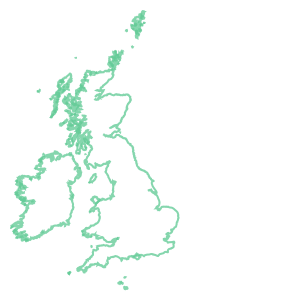

In [10]:
import geopandas as gpd
from shapely.geometry import Point

datasetxx['geometry'] = datasetxx.apply(lambda row: Point(row['Long'], row['Lat']), axis=1)
gdf = gpd.GeoDataFrame(datasetxx, geometry='geometry', crs='EPSG:4326')

coastline = gpd.read_file('data/ukcp18-uk-marine-coastline-lowres.shp')  # or .geojson
coastline.crs = "EPSG:27700"
coastline = coastline.to_crs('EPSG:3857') # Project to metric for distance calculation
gdf = gdf.to_crs('EPSG:3857')

# Create a unary union of the coastline polygons/lines for faster distance computation
coastlines = coastline.boundary
coastline_union = coastlines.unary_union
coastline_geom = gpd.GeoSeries([coastline_union], crs=coastline.crs)

# Compute distance in meters
gdf['distance_to_coast'] = gdf['geometry'].apply(lambda x: x.distance(coastline_geom.iloc[0]))

# 20 km = 20,000 meters
coastal = gdf[gdf['distance_to_coast'] <= 20000]
inland = gdf[gdf['distance_to_coast'] > 20000]

coastal_df = pd.DataFrame(coastal.drop(columns='geometry'))
inland_df = pd.DataFrame(inland.drop(columns='geometry'))
datasetxx = datasetxx.drop(['geometry'], axis=1)
coastline_union

In [11]:
inland_df.shape

(29413, 68)

In [12]:
coastal_df.shape

(186045, 68)

In [13]:
datasetxx = gdf.drop(['geometry'], axis=1)
datasetxx.shape

(215458, 68)

In [14]:
#datasetxx.to_csv('data/train_ecoliall51__lc_w_mod.csv', index=False)

# Final Generated Dataset

In [2]:
# final generated dataset is "train_ecoliall51_weather.csv"
datasetxx = pd.read_csv('data/train_ecoliall51__lc_w_mod.csv') # final dataset for training light model
datasetxx.shape

(215458, 68)

In [3]:
datasetxx.columns

Index(['id', 'Lat', 'Long', 'samplingPointnotation', 'station_type',
       'timedate', 'date', 'time', 'Ecoli', 'easting', 'northing',
       'land_cover', 'agri', 'forest', 'grass', 'wetland', 'build', 'others',
       'lst', 'fpar', 'emis31', 'lai', 'temperature_11am', 'humidity_11am',
       'windspeed_11am', 'windgusts_11am', 'winddirection_11am',
       'precipitation_11am', 'rain_11am', 'snowfall_11am', 'cloudcover_11am',
       'pressure_msl_11am', 'soil_temp_7cm', 'soil_moist_7cm', 'vap_press_def',
       'et0_fao_evap', 'sun_duration', 'global_tilted_irr', 'short_rad',
       'dir_rad', 'dew_point_2m', 'temp_min', 'temp_max', 'precipitation_sum',
       'rain_sum', 'snowfall_sum', 'windspeed_max', 'windgusts_max',
       'winddirection_dominant', 'precipitation_hours', 'sunshine_duration_d',
       'daylight_duration_d', 'short_rad_sum_d', 'et0_fao_evap_d', 'temp_min7',
       'temp_max7', 'precipitation_sum7', 'rain_sum7', 'snowfall_sum7',
       'windspeed_max7', 'windgusts

time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
The correlation is above 1 or below -1. This can occur due to the binning method used. Please check the data and the binning method and use the autocorrelation function with extreme care.
time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
time series does not have regular time steps, the fallback_bin_method'gaussian' is applied
time series does not have regular time steps, the fallback_bin_method'gaussian' is a

ACF averaged on 147 sampling locations


Text(0, 0.5, 'Mean Autocorrelation')

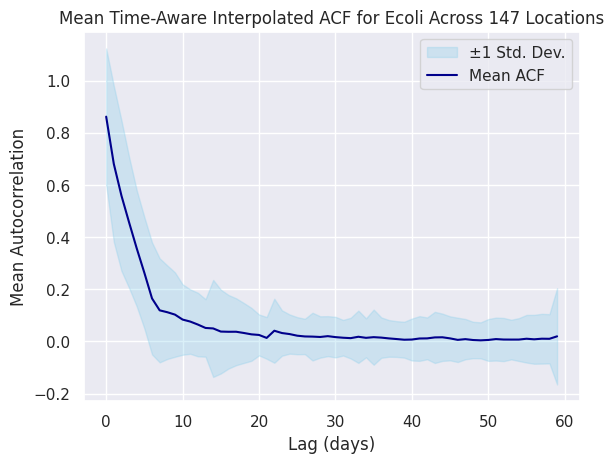

In [11]:
import pastas as ps

grouped_data = datasetxx[['Ecoli','Long','Lat']]
grouped_data = grouped_data.dropna().reset_index(drop=True)
grouped_data = grouped_data.groupby(["Lat", "Long"]).agg(
    ecoli_mean = ("Ecoli","mean"),
    ecoli_count = ("Ecoli","count")
).reset_index()

acf_matrix = []
lags = np.arange(0, 60, 1)
for j, i in enumerate(range(len(grouped_data))):
    lat = grouped_data.sort_values('ecoli_count',ascending=False).Lat.iloc[i]
    lon = grouped_data.sort_values('ecoli_count',ascending=False).Long.iloc[i]
    filtered_df = datasetxx[(datasetxx['Lat'] == lat) & (datasetxx['Long'] == lon)]

    if len(filtered_df) < 10:
        continue  # skip loctions with very short series
        
    # Step 2: Ensure datetime index
    filtered_df['date'] = pd.to_datetime(filtered_df['date'])
    filtered_df.set_index('date', inplace=True)

    # Step 3: Drop missing values
    ecoli_series = filtered_df['Ecoli'].dropna()

    # Step 4: ACF
    try:
        acf_result = ps.stats.acf(ecoli_series, lags=lags)
    except:
        continue
        
    # Only continue if result has enough points
    if len(acf_result) < 3:
        continue # skip ACF with very short series
        
    # Interpolate to common lags (in days)
    acf_interp = np.interp(lags, acf_result.index.days, acf_result.values)
    acf_matrix.append(acf_interp)
    

# Step 5: Convert to NumPy array and compute average
acf_array = np.array(acf_matrix)
mean_acf = np.nanmean(acf_array, axis=0)  # average across remained locations
std_acf = np.nanstd(acf_array, axis=0)

print(f'ACF averaged on {len(acf_array[:])} sampling locations')

"""
# Plot the average Interpolated ACF
plt.figure(figsize=(12, 6))
plt.plot(lags, mean_acf, linestyle='-', color='darkblue')
plt.title('Mean Time-Aware Interpolated ACF for Ecoli Across Most Locations')
plt.xlabel('Lag (days)')
plt.ylabel('Mean Autocorrelation')
plt.grid(True)
plt.tight_layout()
plt.show()
"""
# Plot the average Interpolated ACF
plt.fill_between(lags, mean_acf - std_acf, mean_acf + std_acf,
                 alpha=0.3, color='skyblue', label='±1 Std. Dev.')
plt.plot(lags, mean_acf, color='darkblue', label='Mean ACF')
plt.legend()
plt.title(f'Mean Time-Aware Interpolated ACF for Ecoli Across {len(acf_array[:])} Locations')
plt.xlabel('Lag (days)')
plt.ylabel('Mean Autocorrelation')

# Outlier Removal

Generate season and time columns, and adds inland and coastal area seperation instead of distance to coast. Later, removes outlier samples. Outliers can significantly impact model performance. This step involves detecting and removing extreme values using Z-score analysis.

In [9]:
datasetxxt = datasetxx.drop(['id','samplingPointnotation','station_type',
                            'easting', 'northing','timedate'],axis=1)
datasetxxt['season'] = pd.DatetimeIndex(datasetxxt['date']).month%12 // 3 + 1 # Season
datasetxxt['time'] = pd.DatetimeIndex(datasetxxt['time']).hour
# considers sampling location with less than 5km distance from coast as coastal and rest as inland sampling location
datasetxxt['distance_to_coast'] = datasetxxt['distance_to_coast'].apply(lambda x: 0 if x<=5000 else 1)

#datasetxxt = datasetxxt.dropna().reset_index(drop=True)

a = np.array(datasetxxt['Ecoli'].values)
#datasetxxt['E.coli C-MF'] = np.where(a > 10000, 10000, a) # replace values with higher than 10k with 10k (can be deleted based on need)
# outlier removal using Z-score
for i in datasetxxt.columns:
    if not i == 'date':
        z = np.abs(stats.zscore(datasetxxt[i]))
        outlier_indices = np.where(z > 15)[0]
        #print(datasetxxt[i][outlier_indices]) # prints removed outliers
        z[z < 15] = np.nan
        z.dropna()
        if z.any():
            if z.argmin():
                print(i)
                print(datasetxxt[i][z.argmin()]) # prints cut off point
        datasetxxt = datasetxxt.drop(outlier_indices).reset_index(drop=True)
datasetxxt.shape

Ecoli
2880000.0
others
19.76381227932483
precipitation_11am
6.0
rain_11am
5.6
snowfall_11am
0.28
snowfall_sum
2.5199997
snowfall_sum7
8.4


(214488, 63)

In [10]:
# to sort dataset in the required order
datasetxxt = datasetxxt[['Lat', 'Long', 'date','time', 'Ecoli', 'land_cover', 'agri', 'forest',
       'grass', 'wetland', 'build', 'others', 'lst', 'fpar', 'emis31', 'lai',
       'temperature_11am', 'humidity_11am', 'windspeed_11am', 'windgusts_11am',
       'winddirection_11am', 'precipitation_11am', 'rain_11am',
       'snowfall_11am', 'cloudcover_11am', 'pressure_msl_11am',
       'soil_temp_7cm', 'soil_moist_7cm', 'vap_press_def', 'et0_fao_evap',
       'sun_duration', 'global_tilted_irr', 'short_rad', 'dir_rad',
       'dew_point_2m', 'temp_min', 'temp_max', 'precipitation_sum', 'rain_sum',
       'snowfall_sum', 'windspeed_max', 'windgusts_max',
       'winddirection_dominant', 'precipitation_hours', 'sunshine_duration_d',
       'daylight_duration_d', 'short_rad_sum_d', 'et0_fao_evap_d', 'temp_min7',
       'temp_max7', 'precipitation_sum7', 'rain_sum7', 'snowfall_sum7',
       'windspeed_max7', 'windgusts_max7', 'winddirection_dominant7',
       'precipitation_hours7', 'sunshine_duration_d7', 'daylight_duration_d7',
       'short_rad_sum_d7', 'et0_fao_evap_d7', 'distance_to_coast', 'season']]

# Data Split

The dataset is split into training and testing sets, ensuring that the model generalizes well to unseen data. The split ratio is 85-15.

Two training approach considered: 

**Random Geographic Split Training:** Trained on most of catchments and tested on the rest unseen catchments.
This method is suitable when new unseen catchments are under study.

**Random Temporal Split Training:** Trained on 85% of data samples for all catchments and tested on the remaining 15% of the dataset.
This method is suitable when current trained catchments are under study.

In [11]:
#datasetxxt['Ecoli'] = np.log10(datasetxxt['Ecoli'])
#datasetxxt = datasetxxt.dropna().reset_index(drop=True)
y = datasetxxt['Ecoli']
X = datasetxxt.drop(['Ecoli','Lat', 'Long', 'date'], axis=1)


# for Geographical Split
locations = datasetxxt[['Lat', 'Long']].drop_duplicates()
train_l, test_l = train_test_split(locations, test_size=0.15, random_state=41)
train = pd.merge(datasetxxt, train_l, on=['Lat', 'Long'])
test = pd.merge(datasetxxt, test_l, on=['Lat', 'Long'])
print('Number of training catchments: %.0f' %  train['Lat'].nunique())
print('Number of testing catchments: %.0f' %  test['Lat'].nunique())

X_train = train.drop(['Ecoli','Lat', 'Long', 'date'], axis=1) #,"snowfall_11am", "snowfall_sum"
X_test = test.drop(['Ecoli','Lat', 'Long', 'date'], axis=1) #,"snowfall_11am", "snowfall_sum"
y_train, y_test = train['Ecoli'], test['Ecoli']
"""

# for Temporal Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
"""

# replace values with higher than 10k with 10k (can be deleted based on need)
# helps the model to focus on lower E.coli consentration
a = np.array(y_train.values)
y_train = np.where(a > 10000, 10000, a) 

Number of training catchments: 3385
Number of testing catchments: 598


In [12]:
X_test.shape

(34685, 59)

In [13]:
X_test.columns

Index(['time', 'land_cover', 'agri', 'forest', 'grass', 'wetland', 'build',
       'others', 'lst', 'fpar', 'emis31', 'lai', 'temperature_11am',
       'humidity_11am', 'windspeed_11am', 'windgusts_11am',
       'winddirection_11am', 'precipitation_11am', 'rain_11am',
       'snowfall_11am', 'cloudcover_11am', 'pressure_msl_11am',
       'soil_temp_7cm', 'soil_moist_7cm', 'vap_press_def', 'et0_fao_evap',
       'sun_duration', 'global_tilted_irr', 'short_rad', 'dir_rad',
       'dew_point_2m', 'temp_min', 'temp_max', 'precipitation_sum', 'rain_sum',
       'snowfall_sum', 'windspeed_max', 'windgusts_max',
       'winddirection_dominant', 'precipitation_hours', 'sunshine_duration_d',
       'daylight_duration_d', 'short_rad_sum_d', 'et0_fao_evap_d', 'temp_min7',
       'temp_max7', 'precipitation_sum7', 'rain_sum7', 'snowfall_sum7',
       'windspeed_max7', 'windgusts_max7', 'winddirection_dominant7',
       'precipitation_hours7', 'sunshine_duration_d7', 'daylight_duration_d7',
       

### Show test and train locations on the map for Geographical Split

In [48]:
# Show test and train locations on the map for Geographical Split
import folium
import pandas as pd
import branca.colormap as cm
from scipy import stats
from utils import getradius1

# take in only if doing temporal spilt
# also first stop dropping 'Ecoli','Lat', 'Long' from X on above cell
#train = X_train # to be removed on Geospatioal split
#test = X_test # to be removed on Geospatioal split


grouped_data = train[['Ecoli','Long','Lat']]
grouped_data = grouped_data.dropna().reset_index(drop=True)
grouped_data = grouped_data.groupby(["Lat", "Long"]).agg(
    ecoli_mean = ("Ecoli","mean"),
    ecoli_count = ("Ecoli","count")
).reset_index()

# Sample data generation (Replace this with your actual DataFrame)
df = grouped_data
df = df[df['Lat'] > 49.90] #Drop unwanted rows
df = df[df['Lat'] < 61] #Drop unwanted rows


m = folium.Map(location=[df['Lat'].median(), df['Long'].median()], zoom_start=5)

colormap = cm.LinearColormap(colors=['green', 'yellow'], vmin=0, vmax=1000000)

# Add circle markers for each location
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius= getradius1(row['ecoli_count']*100),  # Scale the radius according to the counts
        color=colormap(row['ecoli_mean']),  # Assign color based on intensity
        fill=True,
        fill_opacity=0.6,
        popup=f"Intensity: {row['ecoli_mean']}"
    ).add_to(m)
    
grouped_data = test[['Ecoli','Long','Lat']]
grouped_data = grouped_data.dropna().reset_index(drop=True)
grouped_data = grouped_data.groupby(["Lat", "Long"]).agg(
    ecoli_mean = ("Ecoli","mean"),
    ecoli_count = ("Ecoli","count")
).reset_index()

# Sample data generation (Replace this with your actual DataFrame)
df = grouped_data
df = df[df['Lat'] > 49.90] #Drop unwanted rows
df = df[df['Lat'] < 61] #Drop unwanted rows

colormap = cm.LinearColormap(colors=['red', 'yellow'], vmin=0, vmax=10000000)


for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius= getradius1(row['ecoli_count']*100),  # Scale the radius according to the counts
        color=colormap(row['ecoli_mean']),  # Assign color based on intensity
        fill=True,
        fill_opacity=0.6,
        popup=f"Intensity: {row['ecoli_mean']}"
    ).add_to(m)

# Save map to an HTML file
#m.save('ecoli_l.html')

m

# Distribution Analysis

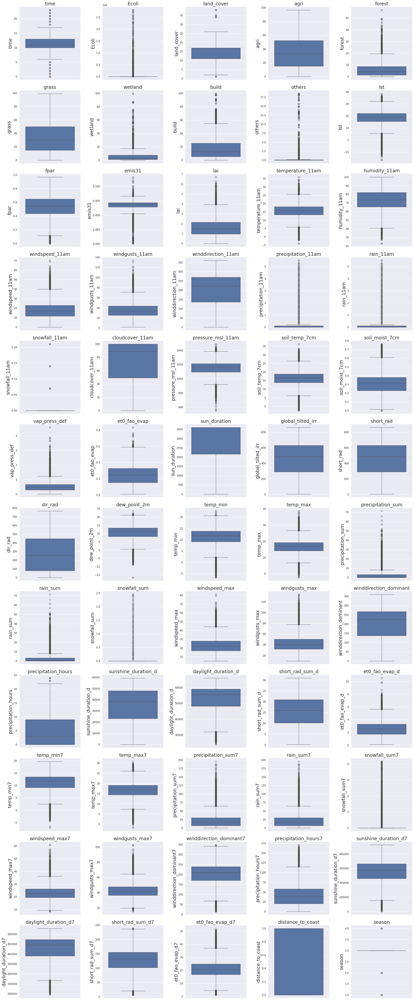

In [8]:
# distribution analysis
def plot_boxplots(df):
    j = 5
    num_columns = len(df.columns)
    num_rows = math.ceil(num_columns/j)
    
    fig, axes = plt.subplots(nrows=num_rows, ncols=min(j,num_columns), figsize=(5*min(j,num_columns), 5*num_rows))
    
    plt.rcParams['font.size'] = '16'
    axes = axes.flatten()
    if num_columns == 1:
        axes = [axes]

    for i, col in enumerate(df.columns):
        sns.boxplot(data=df, y=col, ax=axes[i])
        axes[i].set_title(f'{col}' , fontsize=20)
        axes[i].set_ylabel(col, fontsize=20)
    
    for i in range(num_columns, len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

plot_boxplots(datasetxxt.drop(['Lat', 'Long', 'date'],axis=1))

In [24]:
(datasetxxt.season==3).sum()

123141

## Duplicating the minority class

In [181]:
# this code duplicates the minority class (Ecoli > 1000)(can be ignored, didnt improved the model performance)

X2 = pd.concat([X_train.reset_index(drop=True),pd.DataFrame({'Ecoli': y_train})],axis=1)
# Define the threshold to filter for minority class (Ecoli > 1000)
df_majority = X2[X2['Ecoli'] <= 1000]
df_minority = X2[X2['Ecoli'] > 1000]

# Calculate how many times to duplicate the minority class to match the size of the majority class
majority_count = len(df_majority)
minority_count = len(df_minority)

# Duplicate the minority class to balance the dataset
duplication_factor = majority_count // minority_count - 1
df_minority_duplicated = pd.concat([df_minority] * duplication_factor, ignore_index=True)

# If there's still a difference, we randomly sample the remaining instances
#remaining_samples = majority_count - len(df_minority_duplicated)
#if remaining_samples > 0:
#    df_minority_duplicated = pd.concat([df_minority_duplicated, df_minority.sample(remaining_samples, replace=True)], ignore_index=True)

# inform the categorical data types    
df_minority_duplicated["land_cover"] = df_minority_duplicated.land_cover.astype('category')

def add_noise_to_df(df, noise_level=0.01, random_state=None):
    """
    Add small Gaussian noise to numeric columns of a DataFrame,
    scaled by the column's standard deviation (sqrt of variance).
   
    Parameters:
        df (pd.DataFrame): DataFrame to perturb (e.g., duplicated minority class).
        noise_level (float): Scaling factor for noise magnitude (default=0.01).
        random_state (int or None): Random seed for reproducibility.
       
    Returns:
        pd.DataFrame: New DataFrame with added noise.
    """
    np.random.seed(random_state)

    df_noisy = df.copy()
   
    for col in df_noisy.select_dtypes(include=[np.number]).columns:
        std = df_noisy[col].std()
        if col=="Ecoli":
            noise = np.random.normal(loc=0, scale=noise_level * std * 0.1, size=len(df_noisy))
        else:     
            noise = np.random.normal(loc=0, scale=noise_level * std, size=len(df_noisy))
        df_noisy[col] += noise

    return df_noisy

# add noise
noisy_df = add_noise_to_df(df_minority_duplicated, noise_level=0.01, random_state=42)


# Combine the duplicated minority data with the majority data
df_balanced = pd.concat([X2, noisy_df], axis=0).reset_index(drop=True)

# Shuffle the dataset to ensure random distribution
X2 = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)
y_train = X2['Ecoli'].to_numpy()
X_train = X2.drop(['Ecoli'], axis=1)

#X2.drop(['Ecoli'], axis=1).shape # was not helping

# Normalization

Data normalization ensures that all numerical features are on a similar scale, preventing models from being biased toward large-valued features. MinMax scaling or Standard scaling (Z-score normalization) is used.

The Normalization scales are saved to be used in the inference phase.

In [204]:
Scaler = MinMaxScaler().fit(X_train)#MinMaxScaler
X_trainN = Scaler.transform(X_train)
Scaler1 = MinMaxScaler().fit(y_train.reshape(-1, 1))
y_trainN = Scaler1.transform(y_train.reshape(-1, 1))

"""
scaler_filename = "Model/Scaler_Geo_lgt.save"
joblib.dump(Scaler, scaler_filename) 
scaler_filename = "Model/Scaler1_Geo_lgt.save"
joblib.dump(Scaler1, scaler_filename)
"""

X_testN = Scaler.transform(X_test)
y_testN = Scaler1.transform(y_test.to_numpy().reshape(-1, 1))

# E.coli Estimators

This section focuses on different machine learning models used for regression tasks, estimating E. coli concentration (No/100ml).

## XGBRegressor E.coli Estimator

XGBoost (Extreme Gradient Boosting) is a powerful ensemble learning algorithm known for its high accuracy and efficiency in handling structured data.

In [157]:
# XGBRegressor E.coli Estimator
xgboost = xg.XGBRegressor(objective='reg:tweedie',n_estimators = 200, seed = 12) #absoluteerror
xgboost.fit(X_trainN, y_trainN)

#save model
"""
with open('modelxgb.pkl', 'wb') as f:
    pickle.dump(xgboost, f)"""
y_pre_tr = xgboost.predict(X_trainN)

print('Train RMSE:{}'.format(np.sqrt(mean_squared_error(Scaler1.inverse_transform(y_trainN).reshape(-1, 1),
                                                        Scaler1.inverse_transform(y_pre_tr.reshape(-1, 1))))))

Train RMSE:1602.8864534462043


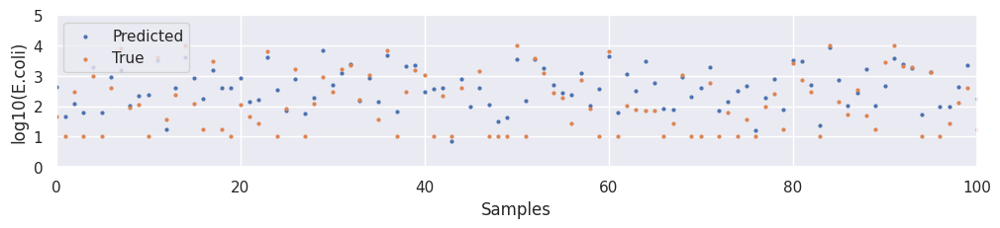

In [158]:
plt.figure(figsize=(12,2))
plt.scatter(range(len(y_pre_tr)),np.log10(Scaler1.inverse_transform(y_pre_tr.reshape(-1, 1))), label='Predicted', s=4)
plt.scatter(range(len(y_pre_tr)),np.log10(Scaler1.inverse_transform(y_trainN).reshape(-1, 1)),label="True", s=4)            
plt.ylabel("log10(E.coli)")
plt.xlabel("Samples")
plt.legend(loc='upper left')
plt.ylim(0,5)
plt.xlim(0,100)
plt.show()

In [159]:
y_pre = xgboost.predict(X_testN)
y_pre = Scaler1.inverse_transform(y_pre.reshape(-1, 1))
y_pre[y_pre<0] = 0 # replace negative prediction with zero


# to calculate RMSE we need to also down scale the test samples as well
a = np.array(y_test.values)
y_test1 = np.where(a > 10000, 10000, a) 

print('Test RMSE:{}'.format(np.sqrt(mean_squared_error(y_test1,
                                                        y_pre))))

Test RMSE:1864.99260266832


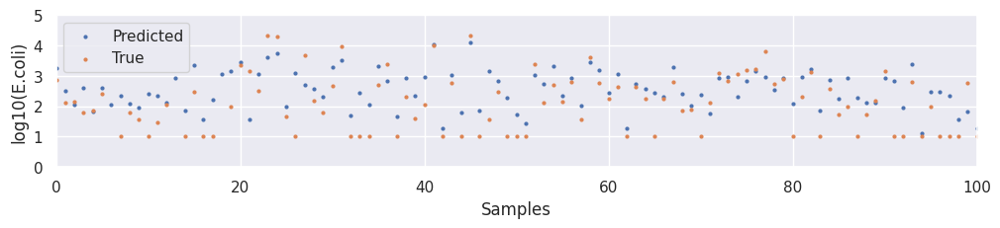

In [160]:
plt.figure(figsize=(12,2))
plt.scatter(range(len(y_pre)),np.log10(y_pre), label='Predicted', s=4)
plt.scatter(range(len(y_test)),np.log10(y_test.to_numpy()),label="True", s=4)            
plt.ylabel("log10(E.coli)")
plt.xlabel("Samples")
plt.legend(loc='upper left')
plt.ylim(0,5)
plt.xlim(0,100)
plt.show()

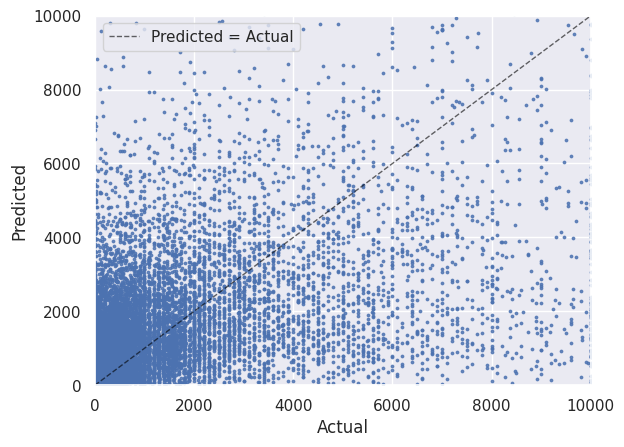

In [161]:
plt.scatter(x=y_test.to_numpy(), y=y_pre, s=3, alpha=0.8)
plt.axline((0, 0),(10000, 10000),color="black",linestyle="--",alpha=0.6,linewidth=1,label="Predicted = Actual",)
plt.xlim(0, 10000)
plt.ylim(0, 10000)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.legend()

### Three classes confusion matrix

col_0,low,moderate,high
row_0,,,
high,0.055520,0.427834,0.799089
moderate,0.244584,0.440069,0.172399
low,0.699896,0.132097,0.028513


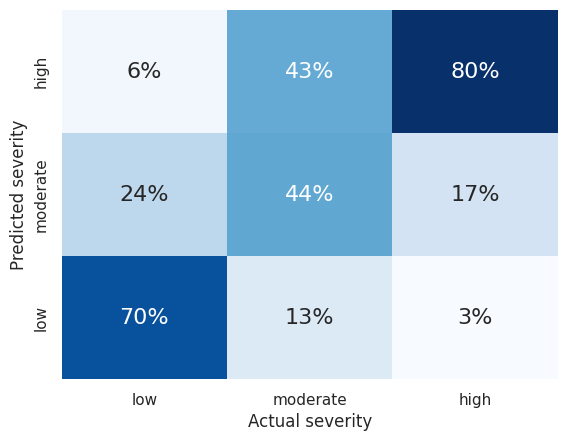

In [162]:
# three classes (x<235, 235<x<1000, 1000<x)
yt_severity = y_test.astype(float).apply(lambda x: ("low" if (x <235)
                                                    else("moderate" if  (1000>=x>=235)
                                                         else "high")))
yp_severity = pd.DataFrame({'ecoli': y_pre.reshape(-1)})['ecoli'].astype(float).apply(lambda x: ("low" if (x <235)
                                                    else("moderate" if  (1000>=x>=235)
                                                         else "high")))

to_plot = pd.crosstab(yp_severity.to_numpy(), yt_severity.to_numpy())
SEVERITY_LEFT_EDGES = {"low": 1, "moderate": 2, "high": 3}
SEVERITY_LEVEL_NAMES = list(SEVERITY_LEFT_EDGES.keys())

# make sure crosstab is even on both axes
for level in SEVERITY_LEVEL_NAMES:
    if level not in to_plot.index:
        to_plot.loc[level, :] = 0
    if level not in to_plot.columns:
        to_plot[level] = 0

# reverse index order for plotting
to_plot = to_plot.loc[SEVERITY_LEVEL_NAMES[::-1], SEVERITY_LEVEL_NAMES]
fmt = ",.0f"

normalize = True
if normalize:
    to_plot = to_plot / to_plot.sum()
    fmt = ".0%"

sns.heatmap(to_plot, cmap="Blues", annot=True, fmt=fmt, cbar=False)
plt.xlabel("Actual severity")
plt.ylabel("Predicted severity")
to_plot

### Two classes confusion matrix

col_0         low-moderate  high
row_0                           
high                  3230  5565
low-moderate         21975  1438
Performance accuracy: 0.85507


Text(46.24999999999999, 0.5, 'Predicted severity')

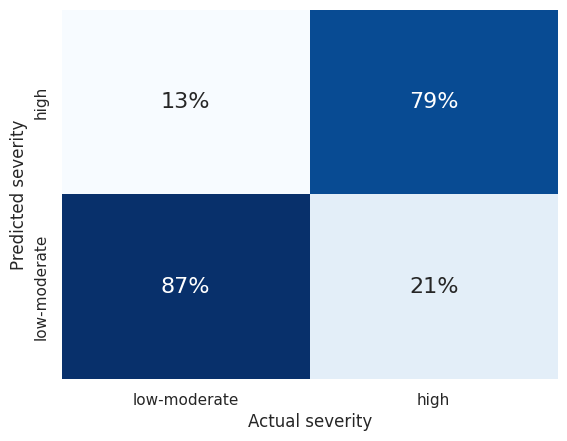

In [163]:
# two classes (x<thr, thr<x)
# U can change the threshold by choosing "thr" value
thr = 1000
yt_severity = y_test.astype(float).apply(lambda x: ("low-moderate" if (x <thr)
                                                         else "high"))
yp_severity = pd.DataFrame({'ecoli': y_pre.reshape(-1)})['ecoli'].astype(float).apply(
    lambda x: ("low-moderate" if (x <thr) else "high"))

to_plot = pd.crosstab(yp_severity.to_numpy(), yt_severity.to_numpy())
SEVERITY_LEFT_EDGES = {"low-moderate": 1, "high": 2}
SEVERITY_LEVEL_NAMES = list(SEVERITY_LEFT_EDGES.keys())

# make sure crosstab is even on both axes
for level in SEVERITY_LEVEL_NAMES:
    if level not in to_plot.index:
        to_plot.loc[level, :] = 0
    if level not in to_plot.columns:
        to_plot[level] = 0

# reverse index order for plotting
to_plot = to_plot.loc[SEVERITY_LEVEL_NAMES[::-1], SEVERITY_LEVEL_NAMES]
fmt = ",.0f"
print(to_plot)
print("Performance accuracy: %.5f" % ((to_plot['high']['high'] + to_plot['low-moderate']['low-moderate'])/y_test.size))
Accuarcy = ((to_plot['high']['high'] + to_plot['low-moderate']['low-moderate'])/y_test.size)

normalize = True
if normalize:
    to_plot = to_plot / to_plot.sum()#.sum()
    fmt = ".0%"

sns.heatmap(to_plot, cmap="Blues", annot=True, fmt=fmt, cbar=False)
plt.xlabel("Actual severity")
plt.ylabel("Predicted severity")

In [20]:
# LGBM model for E.coli Estimator
# Evaluate with the above cell 3 cells
import lightgbm as lgb
hyper_params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': ['l1','l2'],
    'learning_rate': 0.02, #0.005
    'feature_fraction': 0.7,
    #'bagging_fraction': 0.7,
    #'bagging_freq': 10,
    'verbose': 0,
    "max_depth": -1,
    "num_leaves": 15,  # 31
    #"max_bin": 512,
    "num_iterations": 550} # 2550
gbm = lgb.LGBMRegressor(**hyper_params)
gbm.fit(X_trainN, y_trainN
        #eval_set=[(X_testN, y_testN)],
        #eval_metric='l1',
        #callbacks=[lgb.early_stopping(stopping_rounds=10),]
       )
y_pre_tr = gbm.predict(X_trainN
                       #num_iteration=gbm.best_iteration_
                      )
#print('Train RMSE:{}'.format(np.sqrt(mean_squared_error(y_train, y_pre_tr))))
print('Train RMSE:{}'.format(np.sqrt(mean_squared_error(Scaler1.inverse_transform(y_trainN).reshape(-1, 1),
                                                        Scaler1.inverse_transform(y_pre_tr.reshape(-1, 1))))))
y_pre = gbm.predict(X_testN)
y_pre = Scaler1.inverse_transform(y_pre.reshape(-1, 1))
y_pre[y_pre<0] = 0 # replace negative prediction with zero

print('Test RMSE:{}'.format(np.sqrt(mean_squared_error(y_test.to_numpy(),
                                                        y_pre))))

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
Train RMSE:2104.7586091774415
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
Test RMSE:60436.180883978064


col_0,low,moderate,high
row_0,,,
high,0.224228,0.576364,0.786939
moderate,0.688896,0.404757,0.208629
low,0.086877,0.018879,0.004433


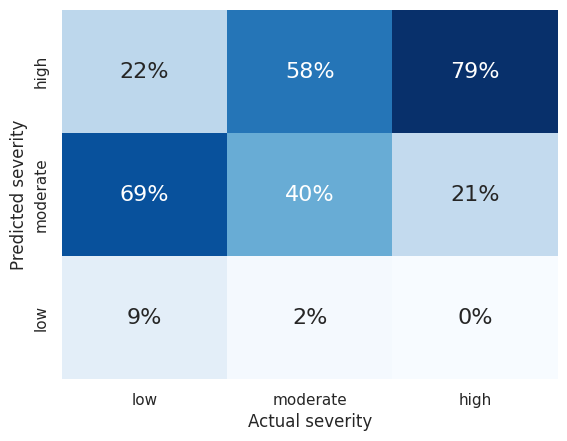

In [21]:
# three classes (x<235, 235<x<1000, 1000<x)
yt_severity = y_test.astype(float).apply(lambda x: ("low" if (x <235)
                                                    else("moderate" if  (1000>=x>=235)
                                                         else "high")))
yp_severity = pd.DataFrame({'ecoli': y_pre.reshape(-1)})['ecoli'].astype(float).apply(lambda x: ("low" if (x <235)
                                                    else("moderate" if  (1000>=x>=235)
                                                         else "high")))

to_plot = pd.crosstab(yp_severity.to_numpy(), yt_severity.to_numpy())
SEVERITY_LEFT_EDGES = {"low": 1, "moderate": 2, "high": 3}
SEVERITY_LEVEL_NAMES = list(SEVERITY_LEFT_EDGES.keys())

# make sure crosstab is even on both axes
for level in SEVERITY_LEVEL_NAMES:
    if level not in to_plot.index:
        to_plot.loc[level, :] = 0
    if level not in to_plot.columns:
        to_plot[level] = 0

# reverse index order for plotting
to_plot = to_plot.loc[SEVERITY_LEVEL_NAMES[::-1], SEVERITY_LEVEL_NAMES]
fmt = ",.0f"

normalize = True
if normalize:
    to_plot = to_plot / to_plot.sum()
    fmt = ".0%"

sns.heatmap(to_plot, cmap="Blues", annot=True, fmt=fmt, cbar=False)
plt.xlabel("Actual severity")
plt.ylabel("Predicted severity")
to_plot

col_0         low-moderate  high
row_0                           
high                 11358  5296
low-moderate         17572  1749
Performance accuracy: 0.63566


Text(46.24999999999999, 0.5, 'Predicted severity')

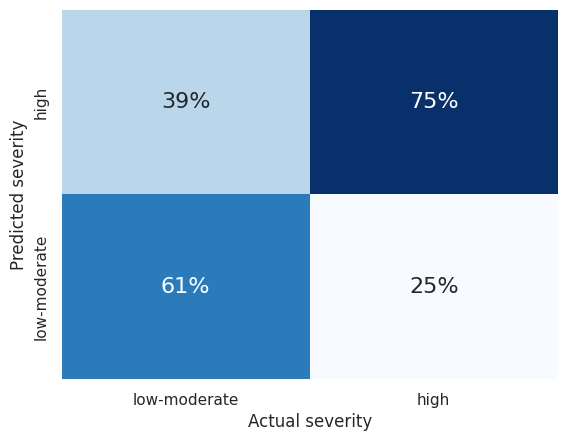

In [35]:
# two classes (x<thr, thr<x)
# U can change the threshold by choosing "thr" value
thr = 1000
yt_severity = y_test.astype(float).apply(lambda x: ("low-moderate" if (x <thr)
                                                         else "high"))
yp_severity = pd.DataFrame({'ecoli': y_pre.reshape(-1)})['ecoli'].astype(float).apply(
    lambda x: ("low-moderate" if (x <thr) else "high"))

to_plot = pd.crosstab(yp_severity.to_numpy(), yt_severity.to_numpy())
SEVERITY_LEFT_EDGES = {"low-moderate": 1, "high": 2}
SEVERITY_LEVEL_NAMES = list(SEVERITY_LEFT_EDGES.keys())

# make sure crosstab is even on both axes
for level in SEVERITY_LEVEL_NAMES:
    if level not in to_plot.index:
        to_plot.loc[level, :] = 0
    if level not in to_plot.columns:
        to_plot[level] = 0

# reverse index order for plotting
to_plot = to_plot.loc[SEVERITY_LEVEL_NAMES[::-1], SEVERITY_LEVEL_NAMES]
fmt = ",.0f"
print(to_plot)
print("Performance accuracy: %.5f" % ((to_plot['high']['high'] + to_plot['low-moderate']['low-moderate'])/y_test.size))
Accuarcy = ((to_plot['high']['high'] + to_plot['low-moderate']['low-moderate'])/y_test.size)

normalize = True
if normalize:
    to_plot = to_plot / to_plot.sum()#.sum()
    fmt = ".0%"

sns.heatmap(to_plot, cmap="Blues", annot=True, fmt=fmt, cbar=False)
plt.xlabel("Actual severity")
plt.ylabel("Predicted severity")

## XGBRegressor model for E.coli Estimator with cross validation

This extends the XGBoost model with cross-validation (CV), ensuring that the model's performance is evaluated across multiple subsets of the data to avoid overfitting. 

In [205]:
# XGBRegressor model for E.coli Estimator with cross validation
#skf = StratifiedKFold(n_splits=5, random_state=40, shuffle=True)
skf = sklearn.model_selection.KFold(n_splits=10, shuffle=True, random_state=40) # to shuffle
#skf = sklearn.model_selection.KFold(n_splits=10, shuffle=False)
# Parameter dictionary specifying base learner 
param = { "objective":"reg:tweedie"} # ,"subsample": 0.9
trained_models = []
scores = []
for i, (train_idx, valid_idx) in enumerate(skf.split(X_train.to_numpy(), pd.DataFrame({'E.coli C-MF': y_train}))):
#for train_idx, valid_idx in skf.split(y_train.to_numpy(), y_train.to_numpy()):
    
    # Train model on fold
    train_split_features = X_train.iloc[train_idx]
    valid_split_features = X_train.iloc[valid_idx]
    train_label_features = pd.DataFrame({'E.coli C-MF': y_train}).iloc[train_idx]
    valid_label_features = pd.DataFrame({'E.coli C-MF': y_train}).iloc[valid_idx]
    
    train_dmatrix = xg.DMatrix(data = train_split_features, label = train_label_features) 
    valid_dmatrix = xg.DMatrix(data = valid_split_features, label = valid_label_features) 
    
    eval_set = [(valid_dmatrix,'eval'), (train_dmatrix,'train')] 
    
    #model.fit(X_train, y_train, eval_metric="error", eval_set=eval_set, verbose=True)

    trained_model = xg.train(params = param, dtrain = train_dmatrix, num_boost_round = 200, evals=eval_set, early_stopping_rounds=20) 
    
    trained_models.append(trained_model)   
    # save model
    #joblib.dump(trained_model, f'Model/xgbr_f{i}_Geo_lgt.joblib')
    
    pred = trained_model.predict(valid_dmatrix) 
    scores.append(np.sqrt(mean_squared_error(pd.DataFrame({'E.coli C-MF': y_train}).iloc[valid_idx],pred)))
    
# RMSE Computation 
print('Validation RMSE:{}'.format(sum(scores) / len(scores)))

[0]	eval-tweedie-nloglik@1.5:668.73323	train-tweedie-nloglik@1.5:654.18026
[1]	eval-tweedie-nloglik@1.5:503.05366	train-tweedie-nloglik@1.5:492.11510
[2]	eval-tweedie-nloglik@1.5:382.56155	train-tweedie-nloglik@1.5:374.38808
[3]	eval-tweedie-nloglik@1.5:296.21987	train-tweedie-nloglik@1.5:290.02210
[4]	eval-tweedie-nloglik@1.5:235.46114	train-tweedie-nloglik@1.5:230.70636
[5]	eval-tweedie-nloglik@1.5:193.88849	train-tweedie-nloglik@1.5:190.23030
[6]	eval-tweedie-nloglik@1.5:166.43050	train-tweedie-nloglik@1.5:163.44834
[7]	eval-tweedie-nloglik@1.5:148.94666	train-tweedie-nloglik@1.5:146.56433
[8]	eval-tweedie-nloglik@1.5:138.00114	train-tweedie-nloglik@1.5:135.83944
[9]	eval-tweedie-nloglik@1.5:131.65958	train-tweedie-nloglik@1.5:129.67833
[10]	eval-tweedie-nloglik@1.5:127.53549	train-tweedie-nloglik@1.5:125.64235
[11]	eval-tweedie-nloglik@1.5:125.40910	train-tweedie-nloglik@1.5:123.51835
[12]	eval-tweedie-nloglik@1.5:124.01508	train-tweedie-nloglik@1.5:122.14806
[13]	eval-tweedie-nlog

In [161]:
preds = []
test_dmatrix = xg.DMatrix(data = X_test, label = y_test) 
for model in trained_models:
    preds.append(pd.Series(data=model.predict(test_dmatrix), dtype='float64'))
preds = pd.concat(preds, axis=1)
preds = preds.mean(axis=1)
preds[preds<0] = 0 # replace negative prediction with zero

# to calculate RMSE we need to also down scale the test samples as well
a = np.array(y_test.values)
y_test1 = np.where(a > 10000, 10000, a) 

# RMSE Computation 
print('Test RMSE:{}'.format(np.sqrt(mean_squared_error(y_test1,preds))))

Test RMSE:1807.7095716565457


In [162]:
#X_test.to_csv("data/Xtest.csv", index=False)
#y_test.to_csv("data/ytest.csv", index=False)

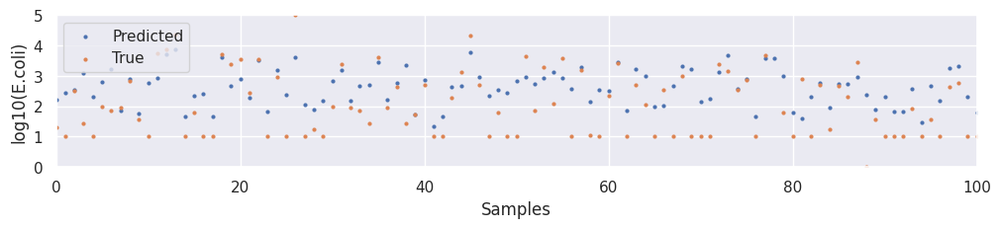

In [163]:
plt.figure(figsize=(12,2))
plt.scatter(preds.index,np.log10(preds.to_numpy()), label='Predicted', s=4)
plt.scatter(preds.index,np.log10(y_test.to_numpy()),label="True", s=4)            
plt.ylabel("log10(E.coli)")
plt.xlabel("Samples")
plt.legend(loc='upper left')
plt.ylim(0,5)
plt.xlim(0,100)
plt.show()

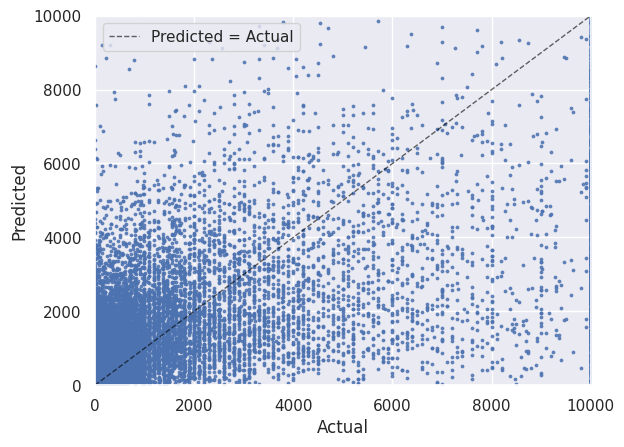

In [164]:
plt.scatter(x=y_test1, y=preds, s=3, alpha=0.8)
plt.axline((0, 0),(10000, 10000),color="black",linestyle="--",alpha=0.6,linewidth=1,label="Predicted = Actual",)
plt.xlim(0, 10000)
plt.ylim(0, 10000)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.legend()

col_0,low,moderate,high
row_0,,,
high,0.059973,0.428356,0.820626
moderate,0.267492,0.454597,0.154403
low,0.672535,0.117047,0.024970


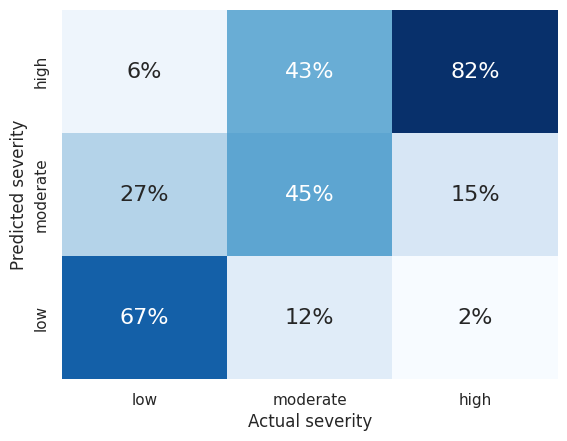

In [165]:
# three classes (x<235, 235<x<1000, 1000<x)
yt_severity = y_test.astype(float).apply(lambda x: ("low" if (x <235)
                                                    else("moderate" if  (1000>=x>=235)
                                                         else "high")))
yp_severity = pd.DataFrame({'ecoli': preds})['ecoli'].astype(float).apply(lambda x: ("low" if (x <235)
                                                    else("moderate" if  (1000>=x>=235)
                                                         else "high")))

to_plot = pd.crosstab(yp_severity.to_numpy(), yt_severity.to_numpy())
SEVERITY_LEFT_EDGES = {"low": 1, "moderate": 2, "high": 3}
SEVERITY_LEVEL_NAMES = list(SEVERITY_LEFT_EDGES.keys())

# make sure crosstab is even on both axes
for level in SEVERITY_LEVEL_NAMES:
    if level not in to_plot.index:
        to_plot.loc[level, :] = 0
    if level not in to_plot.columns:
        to_plot[level] = 0

# reverse index order for plotting
to_plot = to_plot.loc[SEVERITY_LEVEL_NAMES[::-1], SEVERITY_LEVEL_NAMES]
fmt = ",.0f"

normalize = True
if normalize:
    to_plot = to_plot / to_plot.sum()
    fmt = ".0%"

sns.heatmap(to_plot, cmap="Blues", annot=True, fmt=fmt, cbar=False)
plt.xlabel("Actual severity")
plt.ylabel("Predicted severity")
to_plot

Performance accuracy: 0.85613
col_0         low-moderate  high
row_0                           
high                  3338  5691
low-moderate         21854  1291


Text(46.24999999999999, 0.5, 'Predicted severity')

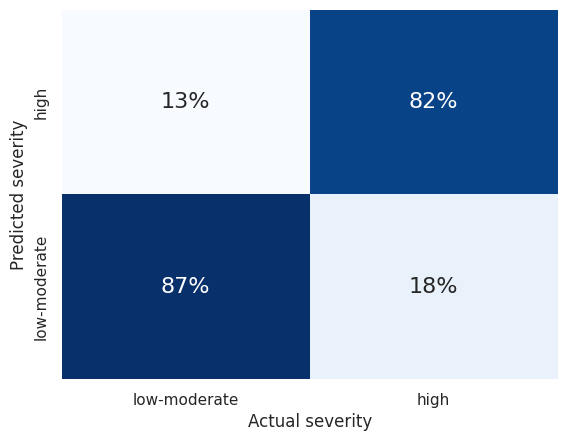

In [166]:
thr = 1000
yt_severity = y_test.astype(float).apply(lambda x: ("low-moderate" if (x <thr)
                                                         else "high"))
yp_severity = pd.DataFrame({'ecoli': preds})['ecoli'].astype(float).apply(lambda x: ("low-moderate" if (x <thr)
                                                         else "high"))

to_plot = pd.crosstab(yp_severity.to_numpy(), yt_severity.to_numpy())
SEVERITY_LEFT_EDGES = {"low-moderate": 1, "high": 2}
SEVERITY_LEVEL_NAMES = list(SEVERITY_LEFT_EDGES.keys())

# make sure crosstab is even on both axes
for level in SEVERITY_LEVEL_NAMES:
    if level not in to_plot.index:
        to_plot.loc[level, :] = 0
    if level not in to_plot.columns:
        to_plot[level] = 0

# reverse index order for plotting
to_plot = to_plot.loc[SEVERITY_LEVEL_NAMES[::-1], SEVERITY_LEVEL_NAMES]
fmt = ",.0f"
Accuracy = ((to_plot['high']['high'] + to_plot['low-moderate']['low-moderate'])/y_test.size)
print("Performance accuracy: %.5f" % Accuracy)
print(to_plot)
normalize = True
if normalize:
    to_plot = to_plot / to_plot.sum()
    fmt = ".0%"

sns.heatmap(to_plot, cmap="Blues", annot=True, fmt=fmt, cbar=False)
plt.xlabel("Actual severity")
plt.ylabel("Predicted severity")

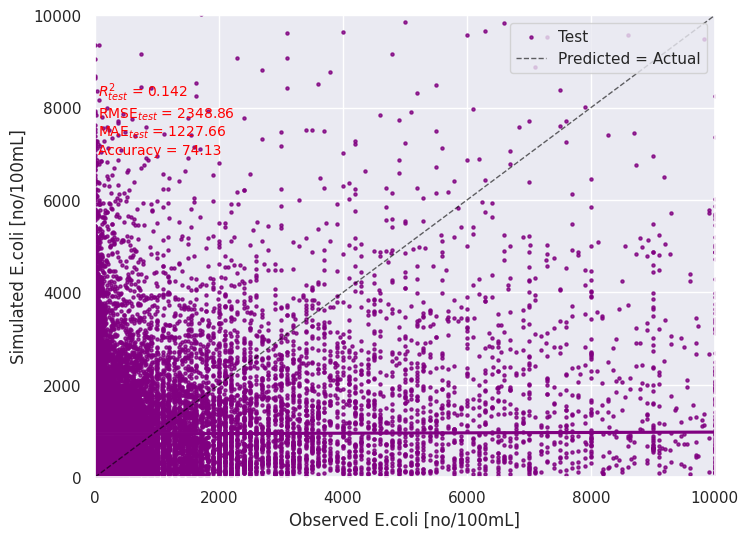

In [114]:
# Calculating metrics
r2_test = r2_score(y_test1, preds)
mae_test = mean_absolute_error(y_test1, preds)
rmse_test = np.sqrt(mean_squared_error(y_test1, preds))

# Creating the plot
plt.figure(figsize=(8, 6))

# Plot test data
sns.regplot(x=y_test, y=preds, scatter_kws={'color':'purple', 's':5}, line_kws={'color':'purple'}, label='Test')

plt.axline((0, 0),(10000, 10000),color="black",linestyle="--",alpha=0.6,linewidth=1,label="Predicted = Actual",)

# Adding text with metrics
plt.text(50, 7000, f'$R^2_{{test}}$ = {r2_test:.3f}\nRMSE$_{{test}}$ = {rmse_test:.2f}\nMAE$_{{test}}$ = {mae_test:.2f}\nAccuracy = {Accuracy*100:.2f}', fontsize=10, color='Red')

# Labels and Title
plt.xlabel('Observed E.coli [no/100mL]')
plt.ylabel('Simulated E.coli [no/100mL]')
plt.xlim(0, 10000)
plt.ylim(0, 10000)
#plt.title('Extreme Gradient Boosting')

plt.legend()
plt.show()

#### 

## Generate Abs of Error data for the histogram

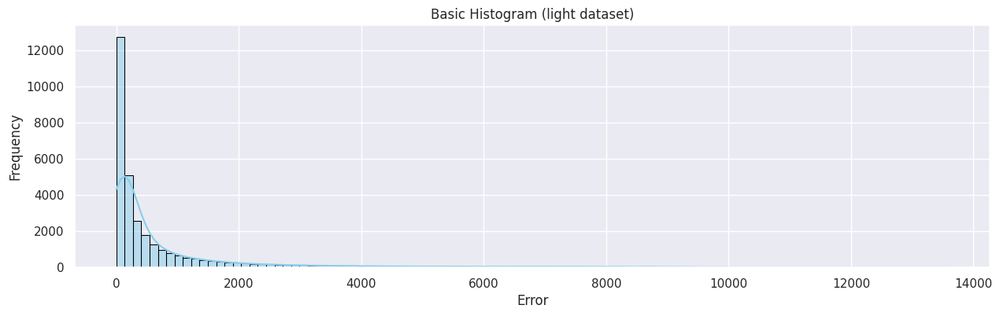

In [25]:
##### Generate Abs of Erorr data for the histogram
abs_erorr = np.abs(y_test1-preds)
 
# Plotting a histogram
plt.figure(figsize=(15, 4))
sns.histplot(abs_erorr, bins=100, kde=True, color='skyblue', edgecolor='black')
 
# Adding labels and title
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.title('Basic Histogram (light dataset)')
 
# Display the plot
plt.show()

## Histogram on the Mean of Error

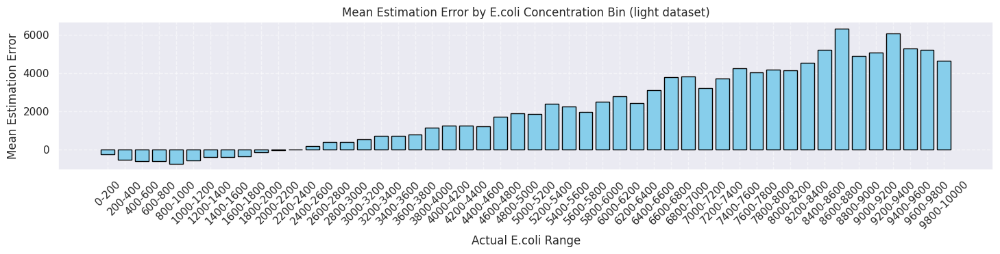

In [26]:
# Define signal strength bins 
bins = np.arange(0, 10200, 200)  

erorr = y_test1-preds
 

# Digitize signal strength into bin indices
bin_indices = np.digitize(y_test1, bins)

# Compute mean error for each bin
mean_errors = []
bin_labels = []

for i in range(1, len(bins)):
    in_bin = bin_indices == i
    if np.any(in_bin):
        mean_error = np.mean(erorr[in_bin])
        mean_errors.append(mean_error)
        bin_labels.append(f"{bins[i-1]}-{bins[i]}")
    else:
        mean_errors.append(0)
        bin_labels.append(f"{bins[i-1]}-{bins[i]}")

# Plotting
plt.figure(figsize=(15, 4))
plt.bar(bin_labels, mean_errors, color='skyblue', edgecolor='black')
plt.xticks(rotation=45)
plt.xlabel('Actual E.coli Range')
plt.ylabel('Mean Estimation Error')
plt.title('Mean Estimation Error by E.coli Concentration Bin (light dataset)')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

## Histogram on the Abd. Mean of Error

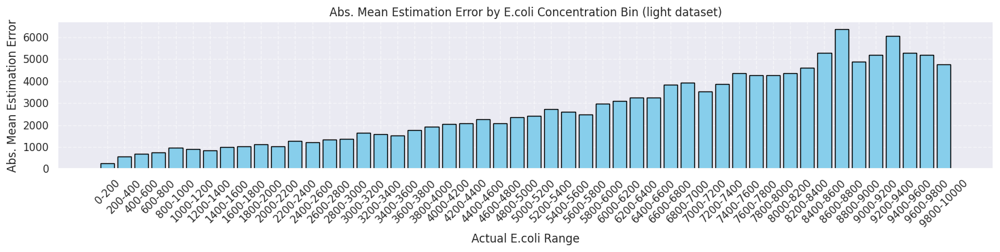

In [27]:
# Define signal strength bins 
bins = np.arange(0, 10200, 200)  

# Digitize signal strength into bin indices
bin_indices = np.digitize(y_test1, bins)

# Compute mean error for each bin
mean_errors = []
bin_labels = []

for i in range(1, len(bins)):
    in_bin = bin_indices == i
    if np.any(in_bin):
        mean_error = np.mean(abs_erorr[in_bin])
        mean_errors.append(mean_error)
        bin_labels.append(f"{bins[i-1]}-{bins[i]}")
    else:
        mean_errors.append(0)
        bin_labels.append(f"{bins[i-1]}-{bins[i]}")

# Plotting
plt.figure(figsize=(15, 4))
plt.bar(bin_labels, mean_errors, color='skyblue', edgecolor='black')
plt.xticks(rotation=45)
plt.xlabel('Actual E.coli Range')
plt.ylabel('Abs. Mean Estimation Error')
plt.title('Abs. Mean Estimation Error by E.coli Concentration Bin (light dataset)')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

## Generate the distribution data in histogram format

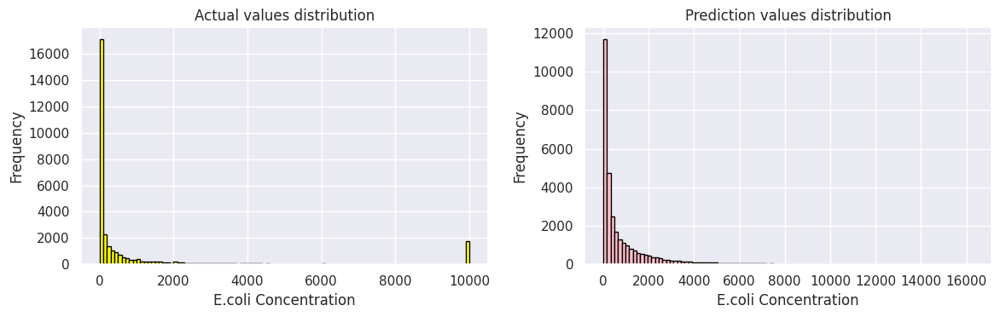

In [28]:
# Generate the distribution data in histogram format
pre = preds

# Plotting a histogram
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
 
axes[0].hist(y_test1, bins=100, color='Yellow', edgecolor='black')
axes[0].set_title('Actual values distribution')
 
axes[1].hist(pre, bins=100, color='Pink', edgecolor='black')
axes[1].set_title('Prediction values distribution')
 
# Adding labels and title
for ax in axes:
    ax.set_xlabel('E.coli Concentration')
    ax.set_ylabel('Frequency')
    
# Adjusting layout for better spacing
plt.tight_layout()
 
# Display the figure
plt.show()

# Precision-Recall and ROC curves 

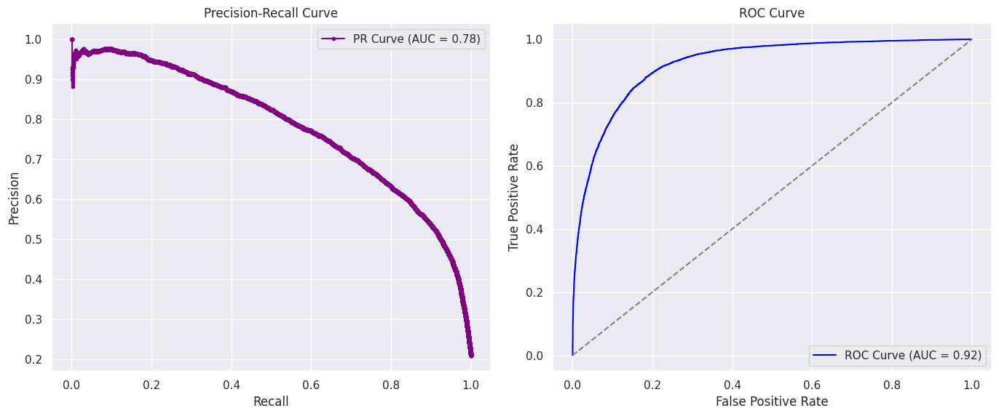

In [29]:
# Define a threshold to create binary classification labels
# y_true > 1000 as the positive class for E.coli
binary_true = (y_test1 > 1000).astype(int)

# Precision-Recall Curve
precision_xgr, recall_xgr, pr_thresholds_xgr = precision_recall_curve(binary_true, preds)
pr_auc_xgr = auc(recall_xgr, precision_xgr)

# ROC Curve
fpr_xgr, tpr_xgr, roc_thresholds_xgr = roc_curve(binary_true, preds)
roc_auc_xgr = auc(fpr_xgr, tpr_xgr)

# 4. Plotting
plt.figure(figsize=(14, 6))

# Precision-Recall Curve
plt.subplot(1, 2, 1)
plt.plot(recall_xgr, precision_xgr, label=f'PR Curve (AUC = {pr_auc_xgr:.2f})', marker='.', color='purple')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid(True)

# ROC Curve
plt.subplot(1, 2, 2)
plt.plot(fpr_xgr, tpr_xgr, color='blue', label=f'ROC Curve (AUC = {roc_auc_xgr:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Other acuuracy metrics

three other Accuracy metrics. 

In [30]:
tst = y_test1.copy()
pre = preds.copy()

tst[tst<10] = 10
tst[tst>10000] = 10000
pre[pre<10] = 10
pre[pre>10000] = 10000

# Accuracy = (1 - sMAPE) * 100
print("Accuracy = (1 - sMAPE) * 100 = %.5f" % (( np.mean(np.abs(tst - pre) / ((np.abs(tst)+np.abs(pre))/2))) * 100),"%")

# Percentage of estimations within a certain error margin.
# Accuracy = (number of estimations with error < thr)/ all samples
thr = 0.4
tst = np.log10(tst)
pre = np.log10(pre)
error = (np.abs(pre - tst))
print("Accuracy = number of estimations with error < 0.4)/ all samples = %.5f" % ((error < thr).sum()/len(error)*100),"%")

# threshold based accuracy. precentage of estimation with error < thr of actual value
thr = 0.05
error = np.abs(pre - tst) < 0.2 * tst
print("Accuracy = precentage of estimation with error < 20 percent of actual value = %.5f" % (error.sum()/len(tst)*100),"%")

Accuracy = (1 - sMAPE) * 100 = 63.87142 %
Accuracy = number of estimations with error < 0.4)/ all samples = 70.91545 %
Accuracy = precentage of estimation with error < 20 percent of actual value = 81.43675 %


# E.coli Classifiers

Unlike the estimators, this section focuses on classification tasks, predicting whether E.coli levels exceed a certain threshold (e.g., high vs. low levels).

In [129]:
# Run this cell only if Temporal Split 
y2 = datasetxxt['Ecoli']
thr = 1000
y2 = y2.astype(float).apply(lambda x: (0 if (x <thr)
                                     else 1))
X_train, X_test, y_train, y_test = train_test_split(X, y2, test_size=0.15, random_state=42)

In [192]:
# Run this cell only if Geographical Split 
y_train2 = y_train.copy()
y_test2 = y_test.copy()

In [198]:
# Run this cell only if Geographical Split 
thr = 500 # change thr and run fron this cell onward
y_train = pd.DataFrame({'Ecoli': y_train2}).astype(float).apply(lambda x: [0 if y < thr else 1 for y in x])
y_test = pd.DataFrame({'Ecoli': y_test2}).astype(float).apply(lambda x: [0 if y < thr else 1 for y in x])

In [199]:
Scaler = MinMaxScaler().fit(X_train) # RobustScaler
X_trainN = Scaler.transform(X_train)
X_testN = Scaler.transform(X_test)

## RandomForestClassifier

In [41]:
rfc = RandomForestClassifier(n_estimators=250)
rfc.fit(X_trainN,y_train)
rfc_pred = rfc.predict(X_testN)
print(classification_report(y_test,rfc_pred))

              precision    recall  f1-score   support

           0       0.87      0.94      0.91     25192
           1       0.70      0.51      0.59      6982

    accuracy                           0.85     32174
   macro avg       0.79      0.73      0.75     32174
weighted avg       0.84      0.85      0.84     32174



[[23672  1520]
 [ 3392  3590]]
0.8473301423509666


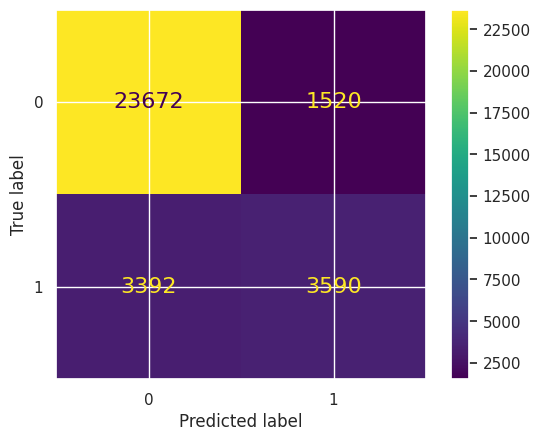

In [42]:
print(confusion_matrix(y_test,rfc_pred))
print((confusion_matrix(y_test,rfc_pred)[1][1] + confusion_matrix(y_test,rfc_pred)[0][0])/confusion_matrix(y_test,rfc_pred).sum())
ConfusionMatrixDisplay.from_estimator(rfc,X_testN,y_test)

## XGBClassifier

This applies XGBoost for classification, effectively handling complex patterns in E. coli presence.

              precision    recall  f1-score   support

           0       0.90      0.95      0.93     25192
           1       0.79      0.62      0.69      6982

    accuracy                           0.88     32174
   macro avg       0.84      0.79      0.81     32174
weighted avg       0.88      0.88      0.88     32174

[[24012  1180]
 [ 2645  4337]]
0.8811151861751725
              precision    recall  f1-score   support

           0       0.90      0.95      0.93     25192
           1       0.79      0.62      0.69      6982

    accuracy                           0.88     32174
   macro avg       0.84      0.79      0.81     32174
weighted avg       0.88      0.88      0.88     32174

0.8811151861751725


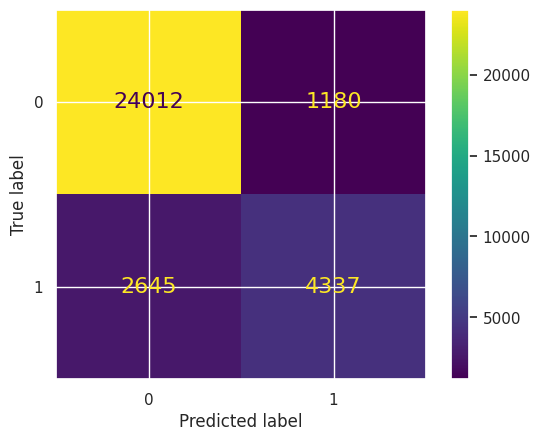

In [43]:
# XGBClassifier
param = {
    'eta': 0.17, 
    'max_depth': 15,  
    'num_class': 1,
    "min_child_weight": 5,
    "gamma": 0.20,
    "colsample_bytree": 0.7,
    'n_estimators': 40}
xgc = XGBClassifier(objective='binary:logistic', **param)
#s = np.array([0,1,2,3,4,5,6,7,8,9,10,11,27,25,24,23,13])
xgc.fit(X_trainN,y_train)
xgc_pred = xgc.predict(X_testN)
print(classification_report(y_test,xgc_pred))
print(confusion_matrix(y_test,xgc_pred))
print(accuracy_score(y_test,xgc_pred))

#save model
"""
with open('modelxgb.pkl', 'wb') as f:
    joblib.dump(xgc, f)
    """

print(classification_report(y_test,xgc_pred))
print(accuracy_score(y_test,xgc_pred))
ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test,xgc_pred)).plot()

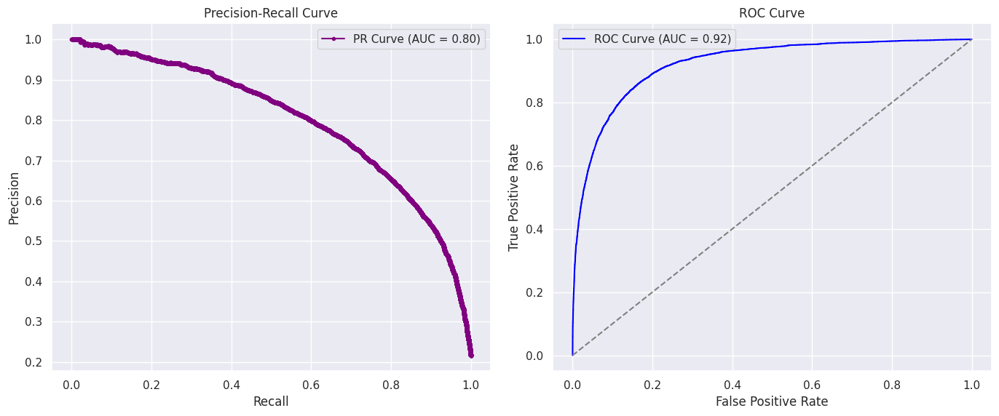

In [44]:
# Get the probobility
y_prob = xgc.predict_proba(X_testN)[:,1]

# Precision-Recall Curve
precision_xgc, recall_xgc, pr_thresholds_xgc = precision_recall_curve(y_test, y_prob)
pr_auc_xgc = auc(recall_xgc, precision_xgc)

# ROC Curve
fpr_xgc, tpr_xgc, roc_thresholds_xgc = roc_curve(y_test, y_prob)
roc_auc_xgc = auc(fpr_xgc, tpr_xgc)

# 4. Plotting
plt.figure(figsize=(14, 6))

# Precision-Recall Curve
plt.subplot(1, 2, 1)
plt.plot(recall_xgc, precision_xgc, label=f'PR Curve (AUC = {pr_auc_xgc:.2f})', marker='.', color='purple')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid(True)

# ROC Curve
plt.subplot(1, 2, 2)
plt.plot(fpr_xgc, tpr_xgc, color='blue', label=f'ROC Curve (AUC = {roc_auc_xgc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## XGBClassifier with cross-validation

Similar to the regression model, this classifier uses cross-validation to improve generalization.

Mean Accuracy: 0.7268
Mean F1 Score: 0.6977
Mean Recall: 0.7268
Mean Precision: 0.6781
Mean False Positives (FP): 0.09200518956321176
Mean False Negatives (FN): 0.1812224304454375
Accuracy: 0.7381
F1 Score: 0.7271
Recall: 0.7381
Precision: 0.7236
False Positives (FP): 0.09200518956321176
False Negatives (FN): 0.1812224304454375


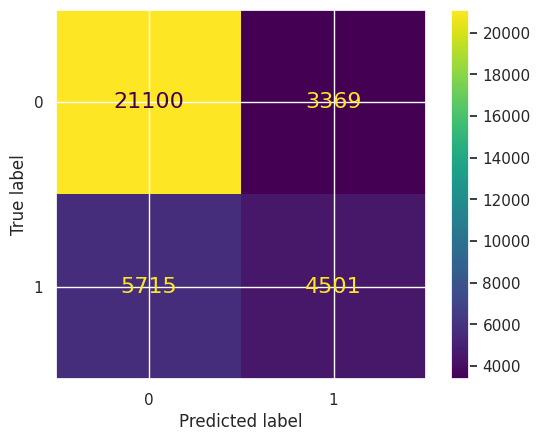

In [200]:
# Initialize K-Fold Cross-Validation
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score,recall_score,precision_score
k = 10  # Number of folds
kf = KFold(n_splits=k, shuffle=False)  # shuffle=True, random_state=42

# Lists to store metrics for each fold
rmse_list = []
mae_list = []
accuracy_list = []
f1_list = []
recall_list = []
precision_list = []
fp_list = []
fn_list = []
y_pred_all = []
y_test_all = []
y_probs = []

# Perform K-Fold Cross-Validation
trained_models = []
for i, (train_index, val_index) in enumerate(kf.split(X_trainN)):
    X_train_fold, X_val_fold = X_trainN[train_index], X_trainN[val_index]
    # add .iloc in case of Geographical split to y_train.reset_index(drop=True).iloc[train_index]
    y_train_fold, y_val_fold = y_train.reset_index(drop=True).iloc[train_index], y_train.reset_index(drop=True).iloc[val_index] 
    
    # Initialize and train the model
    model = XGBClassifier(
    objective='binary:logistic', 
    n_estimators=40,
    learning_rate=0.1,
    gamma=0.2,
    max_depth=15,
    colsample_bytree=0.7,
    min_child_weight=10,
    num_class=1,
    eta=0.17, 
    early_stopping_rounds=20, # remove in case of early stopping
    eval_metric='logloss', # remove in case of early stopping
    random_state=42
    )
    # Fit the model without early stopping
    #model.fit(X_train_fold, y_train_fold)
    

    # Fit the model with early stopping
    model.fit(X_train_fold, y_train_fold, eval_set=[(X_val_fold, y_val_fold)], verbose=False)
   

    # Evaluate on the test set
    y_pred = model.predict(X_testN)
    
    # Get the probobility
    y_prob = model.predict_proba(X_testN)[:,1]
    
    trained_models.append(model)   
    #joblib.dump(model, f'Model/xgbc_f{i}_Geo_lgt_{thr}.joblib')
   
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
   
    # Confusion Matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    
   
    # Append metrics to lists
    accuracy_list.append(accuracy)
    f1_list.append(f1)
    recall_list.append(recall)
    precision_list.append(precision)
    fp_list.append(fp)
    fn_list.append(fn)
    y_pred_all.append(y_pred)
    y_probs.append(y_prob)
    y_test_all.append(y_test)

# Calculate mean of each metric
mean_accuracy = np.mean(accuracy_list)
mean_f1 = np.mean(f1_list)
mean_recall = np.mean(recall_list)
mean_precision = np.mean(precision_list)
mean_fp = np.mean(fp_list)/(tn+fp+fn+tp)
mean_fn = np.mean(fn_list)/(tn+fp+fn+tp)
# Display Results
print(f"Mean Accuracy: {mean_accuracy:.4f}")
print(f"Mean F1 Score: {mean_f1:.4f}")
print(f"Mean Recall: {mean_recall:.4f}")
print(f"Mean Precision: {mean_precision:.4f}")
print(f"Mean False Positives (FP): {mean_fp}")
print(f"Mean False Negatives (FN): {mean_fn}")

# Calculate metrics 
accuracy = accuracy_score(y_test, np.mean(np.array(y_pred_all), axis=0).round())
f1 = f1_score(y_test, np.mean(np.array(y_pred_all), axis=0).round(), average='weighted')
recall = recall_score(y_test, np.mean(np.array(y_pred_all), axis=0).round(), average='weighted')
precision = precision_score(y_test, np.mean(np.array(y_pred_all), axis=0).round(), average='weighted')
# Confusion Matrix
tn, fp, fn, tp = confusion_matrix(y_test, np.mean(np.array(y_pred_all), axis=0).round()).ravel()
precent_fp = np.mean(fp_list)/(tn+fp+fn+tp)
precent_fn = np.mean(fn_list)/(tn+fp+fn+tp)
# Display Results
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Precision: {precision:.4f}")
print(f"False Positives (FP): {precent_fp}")
print(f"False Negatives (FN): {precent_fn}")

#cm = confusion_matrix(np.array(y_test_all).reshape(-1), np.array(y_pred_all).reshape(-1)) # top up on each model fold output
cm = confusion_matrix(np.array(y_test).reshape(-1), np.mean(np.array(y_pred_all), axis=0).round())
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

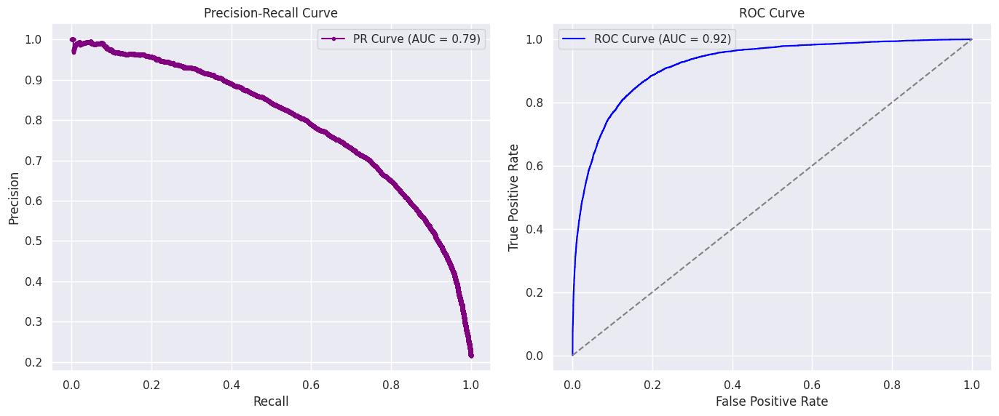

In [68]:
# Precision-Recall Curve
precision_xgc, recall_xgc, pr_thresholds_xgc = precision_recall_curve(np.array(y_test).reshape(-1), np.mean(np.array(y_probs),axis=0))
pr_auc_xgc = auc(recall_xgc, precision_xgc)

# ROC Curve
fpr_xgc, tpr_xgc, roc_thresholds_xgc = roc_curve(np.array(y_test).reshape(-1), np.mean(np.array(y_probs),axis=0))
roc_auc_xgc = auc(fpr_xgc, tpr_xgc)

# 4. Plotting
plt.figure(figsize=(14, 6))

# Precision-Recall Curve
plt.subplot(1, 2, 1)
plt.plot(recall_xgc, precision_xgc, label=f'PR Curve (AUC = {pr_auc_xgc:.2f})', marker='.', color='purple')
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid(True)

# ROC Curve
plt.subplot(1, 2, 2)
plt.plot(fpr_xgc, tpr_xgc, color='blue', label=f'ROC Curve (AUC = {roc_auc_xgc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## Map on Geographical Distribution of Classification Performance

This final step visualizes the model’s accuracy across different geographical locations, helping to identify spatial trends in E.coli classification accuracy.

In [69]:
# Run this cell only for Temporal split 
XX = datasetxxt.drop(['Ecoli','date'], axis=1)
XX_train, XX_test, yy_train, yy_test = train_test_split(XX, y, test_size=0.15, random_state=42)

In [70]:
# On result["result"]: zero means correct classification and one means worng classification

result = pd.concat([y_test, XX_test[["Lat","Long"]]], axis=1) # for Temporal split keep this line
#result = pd.concat([y_test, test[["Lat","Long"]]], axis=1) # for Geographical split keep this line
result["result"] = (result["Ecoli"] ^ xgc_pred)
result.head()

,Ecoli,Lat,Long,result
213050,0,55.962067,-2.395935,0
84649,0,54.868962,-3.371963,0
99640,0,50.049224,-5.606710,0
147302,0,51.386338,-0.456467,0
40008,0,50.462452,-3.535978,0


In [71]:
# map show locations green >75%, 75%> yellow >65%, 65%> orange >55% and 55%> red of accuracy on classification
# with 4 different size of counts
import folium
import pandas as pd
import branca.colormap as cm
from scipy import stats
from utils import getradius2

grouped_data = result[['result','Long','Lat']]
grouped_data = grouped_data.dropna().reset_index(drop=True)
grouped_data = grouped_data.groupby(["Lat", "Long"]).agg(
    ecoli_mean = ("result","mean"),
    ecoli_count = ("result","count")
).reset_index()

# Sample data generation (Replace this with your actual DataFrame)
df = grouped_data
df = df[df['Lat'] > 49.90] #Drop unwanted rows
df = df[df['Lat'] < 61] #Drop unwanted rows


m = folium.Map(location=[df['Lat'].median(), df['Long'].median()], zoom_start=5)

# green >75%, 75%> yellow >65%, 65%> orange >55% and 55%> red 
colormap = cm.LinearColormap(colors=['green', 'yellow', 'orange', 'red'], vmin=0.2, vmax=0.5)

# Add circle markers for each location
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius= getradius2(row['ecoli_count']),  # Scale the radius according to the counts
        color=colormap(row['ecoli_mean']),  # Assign color based on intensity
        fill=True,
        fill_opacity=0.6,
        popup=f"Intensity: {row['ecoli_mean']}"
    ).add_to(m)

# Save map to an HTML file
m.save('ecoli_t2.html')

m